In [1]:
# !gdown --fuzzy https://drive.google.com/file/d/1zqfdkl63Ab0iUTk3j4BN0GNGoVq4Jzry/view?usp=sharing

In [2]:
# !unzip solution.zip

In [43]:
# !mkdir data
# !wget -O data/предсказание_спроса.zip https://ai-data.obs.ru-moscow-1.hc.sbercloud.ru/%D0%BF%D1%80%D0%B5%D0%B4%D1%81%D0%BA%D0%B0%D0%B7%D0%B0%D0%BD%D0%B8%D0%B5_%D1%81%D0%BF%D1%80%D0%BE%D1%81%D0%B0.zip
# !cd data && unzip предсказание_спроса.zip

In [44]:
import pandas as pd
import numpy as np
import sklearn
import json
import torch
import os
import matplotlib.pyplot as plt
import plotly.express as px

In [45]:
open('data/Описание полей.txt', 'r', encoding='cp1251').readlines()

['Поля:\n',
 '•\tLabel – целевая метка\n',
 '•\tperiod – год и месяц\n',
 '•\tsubject_type – тип региона\n',
 '•\tsubject_name – название региона\n',
 '•\tcity_name – название города\n',
 '•\thex – код гексогона\n',
 '•\thex_lat – широта гексогона\n',
 '•\thex_lon – долгота гексогона\n',
 '•\tf1…f30 – дополнительная информация о клиенте\n']

## EDA

In [46]:
data = pd.read_csv('data/train.csv', sep=';')
data['city_name'] = data['city_name'].str.strip().str.lower()
data.head()

,label,period,subject_type,subject_name,city_name,hex,hex_lat,hex_lon,f1,f2,...,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30
0,1,2020-05-01,Город,Москва,москва,8611aa7a7ffffff,55.729458,37.516569,0.00101,0.00103,...,0.13027,0.0,0.00000,NaN,NaN,NaN,NaN,NaN,0.01737,0.0
1,1,2020-05-01,Город,Москва,москва,8611aa01fffffff,55.975851,37.237085,0.00000,0.00027,...,0.08756,0.0,0.00000,NaN,NaN,NaN,NaN,NaN,0.01152,0.0
2,1,2020-05-01,Город,Москва,москва,861181b6fffffff,55.622721,37.695121,0.00339,0.00313,...,0.09243,0.0,0.00000,0.11053,0.57895,0.00526,0.02105,0.00000,0.01540,0.0
3,1,2020-05-01,Город,Москва,москва,8611aa017ffffff,55.941586,37.157487,0.00048,0.00054,...,0.10192,0.0,0.00049,NaN,NaN,NaN,NaN,NaN,0.01495,0.0
4,1,2020-05-01,Город,Москва,москва,8611aa637ffffff,55.797494,37.676200,0.00164,0.00179,...,0.09620,0.0,0.00000,0.14444,0.64444,0.01111,0.04444,0.01111,0.01266,0.0


In [47]:
(data['city_name'].value_counts() > 1000).sum()

48

In [48]:
data.groupby('city_name')['hex'].nunique()

city_name
1-е выгорное                           1
14 км                                  2
16 партсъезд                           1
2-го участка института им докучаева    1
21 свободный                           2
                                      ..
яшалта                                 1
яшкино                                 3
яшкинский                              2
яшкуль                                 1
яя                                     2
Name: hex, Length: 4632, dtype: int64

In [49]:
data['subject_name'].value_counts()

Москва             22606
Санкт-Петербург    15876
Краснодарский      11140
Московская         10994
Нижегородская      10371
                   ...  
Алтай                208
Тыва                 168
Ингушетия            145
Ненецкий             101
Чукотский              2
Name: subject_name, Length: 82, dtype: int64

In [50]:
data.shape

(294258, 38)

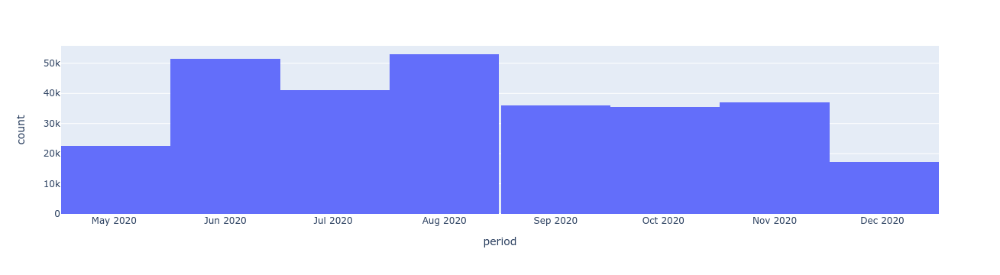

In [51]:
px.histogram(data,x='period')

In [52]:
data['subject_type'].value_counts()

Область               165193
Край                   44249
Город                  38482
Республика             36885
Автономный Округ        8965
Автономная Область       484
Name: subject_type, dtype: int64

In [53]:
data['subject_name'].value_counts()

Москва             22606
Санкт-Петербург    15876
Краснодарский      11140
Московская         10994
Нижегородская      10371
                   ...  
Алтай                208
Тыва                 168
Ингушетия            145
Ненецкий             101
Чукотский              2
Name: subject_name, Length: 82, dtype: int64

In [54]:
data['label'].value_counts()

0    287152
1      7106
Name: label, dtype: int64

In [55]:
len(data['hex'].unique())

7250

In [56]:
len(data['city_name'].unique())

4633

In [57]:
stock = pd.read_csv('data/stocks/EURCB_200101_220801.csv')
stock = stock.rename(columns=lambda x: x[1:-1].lower())
stock['date'] = stock['date'].astype(str).apply(lambda x: f'20{x[-2:]}-{x[1:3]}-01')
stock.head()

,ticker,per,date,time,open,high,low,close,vol
0,EURCB,M,2020-01-01,0,69.3777,69.3777,69.3777,69.3777,0
1,EURCB,M,2020-02-01,0,69.5976,73.7235,68.6201,73.7235,0
2,EURCB,M,2020-03-01,0,73.4178,87.2669,73.4178,85.7389,0
3,EURCB,M,2020-04-01,0,82.6346,83.6826,80.0488,80.0488,0
4,EURCB,M,2020-05-01,0,79.1189,80.0611,77.7854,78.5489,0


In [58]:
ext = pd.read_csv('data/ext_data_v1.csv')
ext['period'] = ext['year'].astype(str) + ext['month'].astype(str).apply(lambda x: x if len(x) == 2 else '0' + x)
ext['period'] = ext['period'].apply(lambda x: f'{x[:-2]}-{x[-2:]}-01')
ext.head()

,year,month,mean_covid19_confirmed,median_covid19_confirmed,mean_covid19_deaths,median_covid19_deaths,mean_google_trends1,mean_google_trends2,mean_google_trends3,mean_google_trends4,mean_google_trends5,mean_google_trends6,period
0,2020,1,0.200000,0.0,0.000000,0.0,44.25,13.00,9.25,30.00,78.50,32.75,2020-01-01
1,2020,2,2.000000,2.0,0.000000,0.0,39.75,8.25,0.00,22.00,76.25,18.00,2020-02-01
2,2020,3,394.322581,90.0,1.741935,0.0,37.80,34.80,0.00,29.40,81.60,55.40,2020-03-01
3,2020,4,37647.900000,26214.0,337.433333,215.0,43.75,13.25,0.00,28.25,77.25,64.00,2020-04-01
4,2020,5,266357.838710,272043.0,2655.258065,2537.0,48.40,13.40,3.00,32.60,77.40,49.60,2020-05-01


## Feature engeneering

In [59]:
import warnings
warnings.filterwarnings("ignore")

In [60]:
import importlib
import train_utils
importlib.reload(train_utils)

<module 'train_utils' from '/home/sergak/Documents/Neyro_sets/rostelecom_cp/train_utils.py'>

In [61]:
cat_cols = ['city_name', 'subject_name', 'subject_type']
drop_cols = ['period', 'hex', 'hex_lat', 'hex_lon']
big_city = list(data['city_name'].value_counts()[(data['city_name'].value_counts() > 1000)].index)
len(big_city)

48

In [62]:
label_per_city = data.groupby('city_name')['label'].mean().reset_index()
label_per_city[label_per_city['city_name'].isin(big_city)].sort_values(by='city_name')[:10]

,city_name,label
153,архангельск,0.050134
233,балашиха,0.006312
259,барнаул,0.022293
362,благовещенск,0.019913
671,владивосток,0.017857
672,владикавказ,0.007175
673,владимир,0.012963
696,волгоград,0.006993
705,вологда,0.028950
721,воронеж,0.007752


In [63]:
def add_stocks(data):
    for name in os.listdir('data/stocks'):
        if not '.csv' in name:
            continue
            
        stock = pd.read_csv(f'data/stocks/{name}')
        stock = stock.rename(columns=lambda x: x[1:-1].lower())
        stock['period'] = stock['date'].astype(str).apply(lambda x: f'20{x[-2:]}-{x[1:3]}-01')
        stock = stock.drop(['per', 'date', 'ticker', 'time', 'vol'], 1)
#         stock['adding'] = stock['close'] - stock['open']
#         stock = stock.drop(['low', 'high', 'open', 'close'], 1)
        
        short_name = name[:name.find('_')]
        stock = stock.rename(columns=lambda x: short_name + '_' + x if x != 'period' else x)
        stock[[el for el in stock.columns if el != 'period']] = sklearn.preprocessing.normalize(stock[[el for el in stock.columns if el != 'period']])
        data = data.merge(stock, on='period')
    return data

In [64]:
def build_pairs_feature(data):
    for i in range(1, 31):
        for j in range(i + 1, 31):
            data[f'f_{i}/{j}'] = data[f'f{i}'] / data[f'f{j}']
#             data[f'f_{i}-{j}'] = data[f'f{i}'] - data[f'f{j}']
    return data

In [65]:
def add_per_month_covid_and_trends(data):
    ext = pd.read_csv('data/ext_data_v1.csv')
    ext['period'] = ext['year'].astype(str) + ext['month'].astype(str).apply(lambda x: x if len(x) == 2 else '0' + x)
    ext['period'] = ext['period'].apply(lambda x: f'{x[:-2]}-{x[-2:]}-01')
    ext = ext[['period', 'mean_covid19_confirmed', 'mean_covid19_deaths', 'mean_google_trends1', 'mean_google_trends3', 'mean_google_trends4']]
    #ext[[el for el in ext.columns if el != 'period']] = sklearn.preprocessing.normalize(ext[[el for el in ext.columns if el != 'period']])
    data = data.merge(ext, on='period')
    return data

In [66]:
agg_city = data.drop(["label"], axis=1).groupby(["city_name"]).agg("mean")
agg_subject_type = data.drop(["label"], axis=1).groupby(["subject_type"]).agg("mean")

def add_agg(data):
    data = data.merge(agg_city, on=["city_name"], how="left")
    data = data.merge(agg_subject_type, on=["subject_type"], how="left")
    return data

In [67]:
import pickle

def add_salary(data):
    with open("data/cities-salary.pkl", "rb") as f:
        salary = pickle.load(f)

    salary = pd.DataFrame(salary, columns=["city", "region", 'value'])
    salary["city"] = salary["city"].str.strip().str.lower()
    city2value = dict(salary[["city", "value"]].values)

    data["salary"] = data["city_name"].apply(lambda x: city2value.get(x, 20000))

    return data

In [68]:
def add_population(data):
    population = pd.read_csv('data/population.csv')
    pop_dict = {c: v for c, v in zip(population['city'].str.strip().str.lower(), population['2020'])}
    data['big_city'] = data['city_name'].apply(lambda x: int(pop_dict[x] >= 1000) + 1 if x in pop_dict.keys() else 0)
    return data

In [69]:
pd.read_csv('population.csv').head()

,city,1897,1926,1939,1959,1970,1979,1989,2002,2010,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Москва,1039,2080.0,4609.0,6133,7194,8057,8878,10126.0,11504.0,...,11980,12108,12198,12330,12381,12506,12615,12678,12655,12635
1,Санкт-Петербург,1265,1737.0,3431.0,3390,4033,4569,4989,4661.0,4880.0,...,5028,5132,5192,5226,5282,5352,5384,5398,5384,5378
2,Новосибирск,8,120.0,404.0,885,1161,1309,1420,1426.0,1474.0,...,1524,1548,1567,1584,1603,1613,1618,1626,1620,1621
3,Екатеринбург,43,140.0,423.0,779,1025,1210,1296,1294.0,1350.0,...,1396,1412,1428,1444,1456,1469,1483,1494,1495,1494
4,Казань,130,179.0,406.0,667,869,989,1085,1105.0,1144.0,...,1176,1191,1206,1217,1232,1244,1252,1257,1257,1259


In [70]:
useless = {'орлик', 'мещерское', 'црау', 'слободской', 'мокино', 'починки', 'анастасиевская', 'саломатово', 'алмазный', 'александровка 2-я', 'уральский', 'лопандино', 'курчатов', 'акъяр', 'малое псеушхо', 'червишево', 'первая падь', 'саракташ', 'лутовиново', 'махачкала', 'падунская', 'детчино', 'сухиничи', 'умба', 'ташенка', 'чернышевский', 'корзуново', 'новоликеево', 'маловасилевское', 'борисово-судское', 'винсады', 'воскресенка', 'бабынино', 'екшур', 'оболенское', 'роговская', 'таскино', 'устьинский', 'удельная', 'славный', 'обидимо', 'банниково-александровский', 'вимовец', 'суук-чишма', 'зырянское', 'русский вожой', 'павловск', 'побединка', 'петропавловское', 'смоленская', 'сальзигутово', 'тополево', 'чернолучинский', 'садовод', 'апаницыно', 'костино', 'новый некоуз', 'сельцо', 'смиркино (смиркинский с/с)', 'лозовое', 'невинномысск', 'спасское', 'вяткино', 'вершинный', 'гурульба', 'чигири', 'политехник', 'колодезный', 'витаминка', 'купино', 'турбаслы', 'беднягина', 'русская поляна', 'алешково', 'порт-катон', 'сабнова', 'советское', 'горяны (козинское с/пос)', 'пронск', 'танда', '1-е выгорное', 'путевка', 'солигалич', 'беляевка', 'богородицкое', 'должанская', 'маккавеево', 'середняя', 'кюндяде', 'оршанка', 'верхотомское', 'кизнер', 'климово', 'яблочное', 'кулунда', 'новоукраинское', 'красносвободное', 'грайворон', 'тара', 'барлак', 'достижение', 'клейзавода', 'старый город', 'усть-баргузин', 'хотьково', 'воскресенск', 'стрелица', 'опытное хозяйство', 'тайдаково', 'весело-вознесенка', 'ханымей', 'пономарево (кумохинский с/с)', 'краснотурьинск', 'светлое поле', 'волошино', 'новый свет', 'богословка', 'новоузенск', 'караваево', 'зубова поляна', 'беловка', 'тюкалинск', 'луковская', 'нижняя омка', 'аннино', 'алнаши', 'медовка', 'мокрый чалтырь', 'ерденевский', 'большая мартыновка', 'новая солянка', 'арги-паги', 'новоорск', 'становое', 'ключевой (п. озерный)', 'темижбекский', 'каргат', 'большое самылово', 'данков', 'усть-тарка', 'ряжск', 'ленинакан', 'эртиль', 'борское', 'большой суходол (федуринский с/с)', 'новлянка', 'гидроторф', 'ардатов', 'арамиль', 'шевели', 'салым', 'рикасиха', 'окский', 'крючково', 'нерчинск', 'трубчевск', 'титовское', 'верхнегрушевский', 'рожок', 'лермонтов', 'ола', 'ургакш', 'тайшет', 'солдато-александровское', 'бурмакино', 'соколовый', 'бам', 'красный восход', 'нюрбачан', 'змиёвка', 'коврово', 'котельниково', 'петруши', 'турбазы приморская', 'барано-оренбургское', 'заокский', 'горушка', 'хазар', 'белорецк', 'плешаново', 'тевриз', 'кудряшовский', 'новый оскол', 'донское', 'большая елань', 'новая ладога', 'прилепы', 'ивот', 'таруса', 'бутово', 'новоспасский', 'абинск', 'сухобузимское', 'барабинск', 'маклино', 'областной с/х опытной станции', 'позариха', 'ишня', 'подкумок', 'пробуждение', 'чусовой', 'шухободь', 'великент', 'харабали', 'большая картель', 'корсаково', 'средняя березовка', 'чернышковский', 'кунашак', 'ракитня-2', 'шаля', 'шварцевский', 'шоссейное', 'панковка', 'ларино', 'обуховское', 'дубровское', 'тамбовка', 'старая торопа', 'новощербиновская', 'чаадаевка', 'деревянка', 'заозерье', 'шарья', 'колхозный', 'маршала жукова', 'торхово', 'евтино', 'молодежное', 'пикалево', 'старовеличковская', 'шелаболиха', 'ртищево', 'кожевниково', 'позднеевка', 'атаманская', 'городец', 'кольчугино', 'пальцо', 'мучкапский', 'снт элитное-м', 'белореченский', 'жигулевск', 'петушки', 'ивантеевка', 'сенькино', 'нижняя тавда', 'ветлуга', 'стабна', 'тишкова', 'фролово', 'курнино', 'екатеринославка', 'великополье', 'лавы', 'мулловка', 'селище', 'старцево', 'ракитное', 'казаки', 'кашхатау', 'мулино', 'рудничный', 'казанково', 'луговое', 'крабозаводское', 'староротовка', 'цивильск', 'фрязино', 'морозовский', 'бродокалмак', 'медведовская', 'медынь', 'сеятель северный', 'шацк', 'мари-турек', 'кумылженская', 'болотово', 'березовский рядок', 'ильино', 'ир', 'нижняя татья', 'опорный', 'большой антибес', 'кишкино', 'михайловский', 'шиханы', 'каменное заделье', 'языково', 'новоаннинский', 'родоманово', 'нижнеподпольный', 'башкова', 'филипповка', 'карабаш', 'крутые выселки мкр солнечный', 'боровая', 'бабстово', 'городцы', 'нежинка', 'правда', 'хрустальный', 'бачурино', 'стрельна', 'дьяченково', 'селезнево', 'сураж', 'драченино', 'мындагай', 'дагестанские огни', 'нововоскресеновка', 'верх-падунский', 'пурпе-1', 'цыбульники', 'климовск', 'новоселицкое', 'дарьевка', 'ашулук', 'автополигон', 'колывань', 'нииох', 'ленинградская', 'скипино (тимирязевский с/с)', 'островское', 'чупа', 'красный бор', 'ногир', 'буценино', 'лодейное поле', 'кобылино', 'апача', 'томичи', 'смолиговка', 'виловатово', 'истомино', 'новый егорлык', 'елово', 'русский брод', 'пелагиада', 'спас', 'монино', 'кудеевский', 'подгорный', 'новобелозеровка', 'десна', 'быковка', 'тогул', 'таежное', 'ковалевка', 'чурачики', 'переславское', 'мещовск', 'чыаппара', 'кирилловка', 'ундоры', 'мадеевка', 'павлоградка', 'стройкерамика', 'ясенцы', 'заборное', 'пласт', 'вараксино', 'ключ жизни', 'новольвовск', 'рабочеостровск', 'сасыкино', 'средняя елюзань', 'климовское', 'месягутово', 'алкино-2', 'семибратово', 'московский', 'бахтемир', 'улахан-ан', 'шугозеро', 'баляга', 'берсеневка', 'нолинск', 'горшечное', 'сокур', 'дубская', 'малое козино', 'кизилов', 'среднее азяково', 'заволжский', 'фаленки', 'канаш', 'безводное', 'санатория им цюрупы', 'некрасовка', 'салаир', 'вохтога', 'елпачиха', 'апшеронск', 'пряжа', 'пролетарский', 'гусев', 'сарафаново', 'селиванкино', 'черный яр', 'кумены', 'смоляниново', 'красная поляна', 'курумкан', 'лопатино', 'некрасовское', 'радищево', 'улыбышево', 'юрино', 'агроном', 'карачиха', 'большое козино', 'корсаково-1', 'ямное', 'володарск', 'самодуровка', 'металлострой', 'старая пустошь', 'шабаново', 'русское', 'зеленец', 'калмыков', 'петра дубрава', 'сторожевое', 'зерцалы', 'агинское', 'новоподклетное', 'сульмаш', 'камышта', 'семкино', 'серебряные пруды', 'усть-буб', 'егорлыкская', 'воскресенское', 'калтан', 'гдов', 'каспля-2', 'волжский', 'себеж', 'махнево', 'ботово', 'рыбалово', 'суворовка', 'тайцы', 'усолье', 'сосьва', 'туапсе', 'зуевка', 'большая талда', 'новопавловск', 'ступино', 'новомихайловский', 'осиновая гора', 'чкалов', 'балай', 'гаровка-2', 'сортавала', 'шокино', 'бардабашка 1', 'брут', 'глинкино', 'куркино', 'нижегородка', 'куркино (майское мо)', 'новоселки', 'таловая', 'котляревская', 'новоангарск', 'шилово', 'плещеево', 'краснокумское', 'соколовское', 'дегтярск', 'им максима горького', 'струнино', 'энгельс', 'лубни', 'токкари', 'заволжск', 'большой лог', 'сухотинка', 'серышево', 'малечкино', 'мундыбаш', 'мамоны', 'дубовское', 'роза', 'глотовка', 'морозовица', 'михновка', 'кощино', 'елатьма', 'ближняя игуменка', 'родники', 'харп', 'сатинка', 'барда', 'чернолесовский', 'кахун', 'покрово-казацкая', 'горки (п/о горки)', 'балтийск', 'александров', 'великое поле', 'краснозерское', 'камышино', 'курлаково', 'десногорск', 'верхневилюйск', 'борисовичи', 'адо-тымово', 'латная', 'рождественский', 'павино', 'леонидово', 'мухоршибирь', 'прасковея', 'савруха', 'дикимдя', 'сергач', 'пестравка', 'яшкуль', 'мокшан', 'шкилевка', 'болотное', 'привольное', 'новая ляля', 'усть-заостровка', 'носелы', 'петрово', 'цементный', 'вольное', 'саган-нур', 'ушакова', 'цаган аман', 'полховский майдан', 'выскатка', 'никольское', 'шентала', 'чишмы', 'потьма', 'азинский', 'литвиновка', 'дачное', 'барское татарово', 'квасовка', 'аскарово', 'верхнеталовка', 'маркова', 'аткарск', 'белозерово (трегубовское с/п)', 'вешенская', 'кирс', 'куминский', 'медное', 'амга', 'арга', 'совхоз имени ленина', 'железноводск', 'хандыга', 'коврино', 'майское', 'павловка (остерское с/пос)', 'лузино', 'весьегонск', 'казанский', 'крутинка', 'ломы', 'сандата', 'двуреченск', 'аркатово', 'энергетик', 'дивеево', 'красногор', 'котовск', 'белокуриха', 'большие уки', 'кальтино', 'нижняя тура', 'подымалово', 'козыревск', 'текстильщики', 'верхнеуральск', 'кыра', 'мистолово', 'мглин', 'порошино', 'тугулым', 'аксаково', 'калиновка', 'свень', 'калиновский', 'безменово', 'машкачи', 'электрогорск', 'анастасиевка', 'крупской', 'буруны', 'дубовое', 'клепиково', 'кудринский участок', 'арефино', 'линево', 'усть-катав', 'майский', 'красные баррикады', 'куртуково', 'досаево', 'липлейка', 'сидорово', 'ендовище', 'вахруши', 'петровский', 'фарн', 'ишеевка', 'кировград', 'устюгский', 'кострома', 'репино', 'черлак', 'новосокольники', 'опочка', 'им в.и.ленина', 'дивное', 'искра октября', 'хатуей', 'суземка', 'клетская', 'новый', 'мантурово', 'красный кут', 'боровск', 'байбек', 'приозерный', 'пригородка', 'вослебово', 'гурьевск', 'спутник(свх ленинский)', 'этыркэн', 'токтайбеляк', 'псыгансу', 'нижний архыз', 'субакаево', 'спас-деменск', 'козьи горы', 'шумячи', 'новоселезнево', 'тапхар', 'горный (двуреченское с/п)', 'новые бурасы', 'узловая', 'выкса', 'марфинка', 'новоалександровка', 'торбеево', 'первомайск', 'печоры', 'тюльган', 'чурапча', 'красавино', 'кременкуль', 'вологда 20', 'туймазы', 'сольцы 2', 'спасск-рязанский', 'чунский', 'новогуровский', 'русский кукмор', 'пировское', 'горняк', 'якшур', 'жуков', 'березовая роща', 'десятуха', 'кромы', 'светогорск', 'семеново', 'игнатовка', 'бабаево', 'микряково', 'шелехов', 'новосемейкино', 'тургенево', 'ермолово', 'клин', 'протвино', 'турлатово', 'краснобродский', 'челно-вершины', 'котино', 'шуя', 'луговой', 'верх-ирмень', 'куйбышев', 'раздольный', 'дворец', 'новолисино', 'параньга', 'пачелма', 'мирное', 'струги красные', 'дракино', 'бузим', 'скрипачи', 'пригородное', 'миганово', 'небуг', 'ключевское', 'шиловский', 'юргинское', 'парца(явасское с/п)', 'савинка', 'хабаровск-47', 'нижний', 'асеньевское', 'октемцы', 'олекминск', 'парная', 'чулым', 'лекаревка', 'рамонь', 'благословенка', 'судогда', 'сяськелево', 'пшеничный', 'вышков', 'новопокровка', 'вожега', 'хочо', 'озинки', 'смышляевка', 'нерехта', 'металлургов', 'дровяная', 'рейдово', 'варфоломеевка', 'кинель-черкассы', 'крутоярский', 'березанская', 'новоозерный', 'лямбирь', 'три протока', 'хохольский', 'жирнов', 'бакалы', 'мугарты', 'шерегеш', 'красногорск', 'новотарманский', 'симаково', 'отрадное', 'парфино', 'плодопитомник', 'бичура', 'юрьевец', '21 свободный', 'курагино', 'анненковский карьер', 'излучинск', 'большой оеш', 'шилка', 'старь', 'дмитров', 'кизильское', 'трехгорный-1', 'тоншалово', 'новопокровская', 'нижние нарыкары', 'свх агроном', 'малая каменка', 'сланцевый рудник', 'синьялы', 'таремское', 'большие салы', 'фирово', 'суда', 'буревестник', 'мельничные памъялы', 'билитуй', 'рябины', 'севск', 'малое верево', 'арзгир', 'гулькевичи', 'добровольск', 'заинск', 'кашары', 'печенкино', 'озеры', 'новолакедемоновка', 'ладушкин', 'учхоз', 'надеждинск', 'латоново', 'нефтегорск', 'ольгино', 'ясеновая', 'абаза', 'среднеуральск', 'хабаровск-43', 'кудымкар', 'гаврилов посад', 'шайковка', 'андреево', 'калининец', 'устюжна', 'учалы', 'антоновка', 'ильиногорск', 'тимофеевка', 'хасавюрт', 'дубенское', 'шаховская', 'кузнецк', 'ржев', 'юрга 2-я', 'дятьково', 'бирск', 'бутырки', 'кузьмищи', 'звягино (казаковский с/с)', 'пыщуг', 'чертково', 'рамешки', 'афимьино', 'вельск', 'хвощевка', 'аким-сергеевка', 'днп марусино', 'белоногово', 'авдон', 'доброе', 'ольгинское', 'стулово', 'рыбкин', 'краснояр 1', 'цильна', 'ермишь', 'кавказская', 'серпухов', 'стрижи', 'чмутово', 'красный яр', 'шатрово', 'рубцово', 'луховицы', 'дубенки', 'войсковицы', 'казаково', 'сертолово', 'хороль', 'нейтрино', 'балашов', 'стрелецкий', 'краснознаменск', 'новоянсаитово', 'духовницкое', 'зиняки (зиняковский с/с)', 'коксовый', 'кзыл-аул', 'платошино', 'вознесеновка', 'кысыл-сыр', 'варениковская', 'куртамыш', 'мишкино', 'злынка', 'кондырева', 'калтасы', 'первое мая(мо рп большое козино)', 'сольвычегодск', 'марусино', 'оленьковский', 'середейский', 'зубово', 'мохово', 'брусянский', 'чаппанда', 'вниисс', 'учкекен', 'сонково', 'безруково', 'анива', 'дрсу-5', 'крученая балка', 'студеные выселки', 'глажево', 'майкино', 'русское тювеево', 'большое село', 'фомичево', 'российский', 'кондратово', 'нижнеангарск', 'золотавцево', 'пермяки', 'ямской', 'долгопрудный', 'ольга', 'жархан', 'большие калмыки', 'акана', 'колобово', 'нижняя салда', 'пестово', 'заозерное', 'суходол', 'толбазы', 'введенка', 'петлино', 'хвалынск', 'новомичуринск', 'калининск', 'нижняя пойма', 'озерный', 'кожласола', 'нехаевская', 'западная двина', 'вал', 'болхов', 'даниловка', 'оранжереи', 'судиславль', 'юхнов', 'рыздвяный', 'болчары', 'кутерем', 'бронница', 'гавриловка 2-я', 'юхнов-1', 'новые горки', 'кинель', 'кондрово', 'лежнево', 'елино', 'старожилово', 'галич', 'юг', 'широкундыш', 'горячие ключи', 'пересыпь', 'дмитриевское', 'николаевск', 'лука', 'мочище', 'тайтурка', 'содышка', 'долинск', 'денисово', 'поляна', 'вязьма-брянская', 'псыж', 'петропавловск', 'средняя ахтуба', 'белев', 'ипатово', 'рыбки', 'сидима', 'адыге-хабль', 'дальневосточная мис', 'черкасская', 'аскино', 'константиновск', 'санталовский', 'чкаловский', 'диево-городище', 'казаковка', 'кузьмоловский', 'николо-малица', 'брянск-4', 'успенское', 'колесниково', 'грузское', 'левокумское', 'гривенская', 'рыбацкий', 'уразовка', 'чаусово', 'новочишма', 'талашкино', 'вознесенская', 'калашников', 'ялуторовск', 'незлобная', 'остер', 'карабулак', 'перекоп', 'глушково', 'иргиз', 'краснянка', 'малаховка', 'красный двор', 'лазурный', 'маклец', 'анджиевский', 'седельниково', 'завитинск', 'кагальницкая', 'большое куземкино', 'шаран', 'андреево-мелентьево', 'селижарово', 'красулино', 'махалино', 'быстрогорский', 'мошенское', 'водозерье', 'чибирлей', 'забойский', 'кептени', 'ромоданово', 'кротовка', 'мариинский посад', 'новогеоргиевка', 'мозгово', 'лев толстой', 'колосово', 'корта', 'прималкинское', 'вязники', 'корекозево', 'новонежино', 'кривцы', 'ремонтное', 'солнечнодольск', 'трудармейский', 'юрьев-польский', 'инзер', 'лысьва', 'голынки', 'корохоткино', 'полтавская', 'сухоногово', 'шаталово 1-е', 'ноглики', 'сарс', 'сосновское', 'гать', 'пчеловодный', 'томашевка', 'льгов', 'первое чемерчеево', 'сетраки', 'ленино', 'байкальск', 'избербаш', 'теберда', 'лазо', 'радченко', 'приморск', 'усть-кан', 'совхоз боровский', 'куяново', 'новая целина', 'килинчи', 'сахарного завода', 'строитель', 'рембуево', 'пойменный', 'собинка', 'аркуль', 'косино', 'курганинск', 'буздяк', 'конец-бор', 'валуйки', 'мокрое', 'подлесово', 'стрелецкое', 'новошахтинский', 'данково', 'подтесово', 'нижний мамон', 'набережные челны', 'санамер', 'днп владимирская слобода', 'смолино', 'кабицыно', 'ватутинки', 'букань', 'еловый бор-1 (шумское с/п) тер.', 'пошехонье', 'шипово', 'андреаполь', 'кстово', 'орловское', 'сторожевка', 'щелково', 'зарайск', 'боровский', 'красный сулин', 'приволжское', 'уяр', 'ясенная', 'гремячее', 'черемушки', 'городок', 'оренбургское', 'зоркальцево', 'поморцево', 'никитино', 'поречье', 'усмань', 'селиваново', 'суворов', 'кузьминские отвержки', 'тюнзыры', 'темрюк', 'быстрянский', 'сараи', 'янгузнарат', 'лысково', 'казинка', 'подберезье', 'белогорск', 'шамокша', 'разбегаевка', 'краснотуранск', 'геймановская', 'фоминское', 'каменногорск', 'ашша', 'вача', 'кондоль', 'бежаницы', 'милютинская', 'загородный', 'полтавка', 'судаково', 'тетюшское', 'леонидовка', 'щербиновский', 'семибалки', 'лунино', 'академический', 'прибрежное', 'ынахсыт', 'барашево', 'большой царын', 'елшанка', 'кольцово', 'дебесы', 'агролес', 'варницы', 'балей', 'ус-кюель', 'демино', 'удобный', 'святогорье', 'армизонское', 'воскресенский', 'приполярный', 'шаранга', 'бурцево', 'ростов', 'шенджий', 'березово', 'ефимовский', 'холмск', 'днт удачный (с. новокаменка)', 'комсомольское', 'пригорское', 'петрушино', 'шишлово', 'кузнецкое', 'сингапай', 'таврическое', 'большая орловка', 'васильевка', 'межозерный', 'овощной', 'волхов', 'андрейково (бурашевское с.п.)', 'новотроицк', 'знаменский', 'обоянь', 'свердловский', 'поназырево', 'наушки', 'бижбуляк', 'нифантово', 'воротынец', 'донгарон', 'койсуг', 'лаголово', 'быково', 'камское', 'луганский', 'свх масловский 1 отделение', 'зеленая роща', 'иглино', 'мордвес', 'мурыгино', 'орск', 'коккорево кп ближняя пристань', 'семенов', 'сновицы', 'суслонгер', 'нижнесортымский', 'юго-камский', 'юрюзань', 'суетово', 'ахтубинск', 'сернур', 'чинеке', 'старое михайловское', 'растопуловка', 'шадрино (бриляковский с/с)', 'байны', 'ершичи', 'солидарность', 'интернациональный', 'новая разводная', 'среднебелая', 'белый городок', 'частые', 'гвардейский', 'шудья', 'тульский', 'чегем', 'нижнекамск', 'волосово', 'газопровод', 'якшур-бодья', 'снт лазурное', 'киржач', 'сим', 'тюрмеровка', 'староварваровка', 'хворостянка', 'усть-рыбница', 'дубровичи', 'владимирский', 'косотуриха', 'мортка', '2-го участка института им докучаева', 'горенка', 'нелжа', 'снежинский', 'дондуковская', 'сотницыно', 'наволоки', 'тихвинка', 'цэс', 'сунтар', 'новопластуновская', 'исаково', 'мичуринское', 'зима южная', 'приморка', 'минино', 'маргаритово', 'кривянская', 'надеждинка', 'кувандык', 'семикаракорск', 'чернятино', 'североуральск', 'базулино', 'морозов', 'волжский утес', 'трудфронт', 'старокучергановка', 'высокое', 'белозерск', 'дорожный', 'довольное', 'жилина', 'каменное', 'нижний ингаш', 'касимово', 'криулино', 'казачий', 'кижинга', 'бебяево', 'начики', 'новые дарковичи', 'урмары', 'аргаяш', 'волово', 'смычка', 'чапаево', 'можга', 'новозавидовский', 'русско-высоцкое', 'днепровская', 'бондари', 'камызяк', 'шолохово', 'яльчики', 'кременки', 'новоорловск', 'грицовский', 'желтоногово', 'омутнинск', 'жеребятьево', 'восходящий', 'шумерля', 'бирюковка', 'выездное', 'александро-невский', 'сретенск', 'новая еловка', 'токи', 'тувси', 'шойбулак', 'радюкино', 'печерск', 'подгорная', 'бисерть', 'нива', 'ляхово', 'кармаскалы', 'нязепетровск', 'старая уда', 'выльгорт', 'иннополис', 'ясные поляны', 'партизанское', 'зарубино', 'заречье тер.', 'сосновая роща', 'навашино', 'слободка', 'мокроносово', 'новосиньково', 'нижнебаканская', 'макарьев', 'черняково', 'рябичев', 'хлебодарное', 'нижняя терновка', 'моршанск', 'кадом', 'скреблово', 'каменки', 'лосино-петровский', 'прилуки', 'качканар', 'грибково', 'филатовка', 'журавское', 'сланцы', 'чистугаш', 'курджиново', 'большая таловая', 'ингарь', 'чална-1', 'нагорный', 'вытегра', 'татарский канадей', 'михайловка (михайловский с/с)', 'алтуд', 'большая соснова', 'заветное', 'листвянский', 'красненькая', 'тарбагатай', 'князе-волконское-1', 'янишполе', 'милославское', 'верхнечерекулево', 'ульт-ягун', 'харлово', 'боевая гора', 'есинка', 'курильск', 'хрустали мини', 'лазарево', 'мга', 'марфино', 'старый сибай', 'заливино', 'донецк', 'ермекеево', 'бежецк', 'любим', 'недвиговка', 'репьевка', 'сакмары', 'самарское', 'суздаль', 'гордеевка', 'большие кириллы', 'берёзовка', 'горьковское', 'гремячье', 'тополевый', 'дзержинского', 'мар', 'большой сундырь', 'приамурский', 'каменск', 'красногорский', 'никольское раздолье', 'мангут', 'батово', 'андрейково', 'краснодонский', 'суходольск', 'коминтерн', 'лебедевка', 'нагать', 'волго-каспийский', 'струково', 'уемский', 'боринское', 'зональная станция', 'новый каракан', 'толбухино', 'шата', 'буй', 'верхний ландех', 'корфовский', 'лиски', 'нартан', 'осиновая речка', 'чагода', 'гигант', 'рефтинский', 'яшкинский', 'кадгарон', 'ракушка', 'малокирсановка', 'ытык-кюель', 'травянское', 'апраксино', 'лаврово', 'петино', 'чебаклей', 'нововаршавка', 'рязанская', 'тим', 'конар', 'александровка', 'атяевка', 'воронцовка', 'к.п. белая усадьба', 'новоульяновский', 'старый черек', 'талица', 'власиха', 'атюрьево', 'большая глушица', 'серебряные ключи', 'за родину', 'лапшиновка', 'молочные дворы', 'нижняя ведуга', 'пригородный', 'хаталдон', 'юсово', 'весенний', 'ильинское', 'мелиховская', 'можайск', 'алексино (с/п семенковское)', 'николаевский', 'удачный', 'казачинское', 'новосысоевка', 'крутово', 'приазовская', 'туношна-городок 26', 'большая елховка', 'кокино', 'сурск', 'жуковское', 'совхозный', 'ботаника', 'кисловодск', 'малая пурга', 'динская', 'уват', 'первый шаг', 'намцы', 'самарова', 'правохеттинский', 'унеча', 'павловский', 'большое мокрое', 'головтеево', 'аристово', 'корнеевка', 'кочубеевское', 'остров', 'нытва', 'сывдарма', 'глинково', 'ермоловка', 'красный гуляй', 'романово', 'селиваниха', 'нелидово', 'ракитино', 'ужур', 'кетченеры', 'колмогорово', 'азово', 'федулов', 'истровка', 'кекур', 'стрелка', 'унъюган', 'покровка', 'маслово', 'ульяново', 'архангельская', 'залесный', 'большое болдино', 'светлогорск', 'вешкайма', 'троекурово', 'медногорск', 'пуровск', 'старопестерево', 'сиверский', 'лебедянь', 'щедрый', 'липовцы', 'кропачево', 'ухтинка', 'бессоновка', 'красная тымь', 'яраг-казмаляр', 'усады', 'картымский', 'белебей', 'калининский', 'относово', 'боброво', 'добринка', 'конышевка', 'архангелка', 'татарская башмаковка', 'пасегово', 'мухино', 'нейфельд', 'большая ирба', 'новочеркасский', 'новоселый 1-й', 'балашов-13', 'ферма', 'октябрьская', 'зеленокумск', 'чебачий', 'успеновка', 'хардиково', 'барсуки', 'кп береговой', 'мингрельская', 'сатис', 'великий устюг', 'ширтаны', 'бобровский', 'ловозеро', 'сокольское', 'усть-нера', 'большое поле', 'зиново', 'окуловка', 'беле-кушальское', 'родниковский', 'спасск', 'лихославль', 'сапожок', 'молодёжный', 'оболенск', 'даньково', 'кантемировка', 'гастелло', 'аргудан', 'барсово', 'карсун', 'циолковский', 'новое кунино', 'лонница', 'моряковский затон', 'евлашево', 'хинганск', 'мусохраново', 'фащевка', 'путятино', 'заплавное', 'сампур', 'новосельцы (козинское с/пос)', 'северин', 'старое шайгово', 'питерка', 'большой березник', 'голубьевка', 'пруды', 'путь ленина', 'сокоч', 'кумыш', 'механизаторов', 'большая каменка', 'сосково', 'гришина слобода', 'косулино', 'буюклы', 'палласовка', 'глядень', 'отрадинское', 'ново-ревякинский', 'боевой', 'верхнеподпольный', 'стодолище', 'пятницкое', 'татаренер', 'русское поле', 'чапланово', 'великий враг', 'завьялово', 'туринск', 'верхнекольцов', 'верхнепашино', 'нефтекумск', 'подшивалово', 'редкино', 'кашин', 'паликского кирпичного завода', 'сасово', 'ишимбай', 'клетня', 'горки (веревское с/п)', 'черемисиново', 'леушино новое', 'губкин', 'бубеньево', 'барышево', 'измалково', 'калязин', 'медвенка', 'невельск', 'вяземский', 'красные четаи', 'сергиевск', 'утечино', 'захарьино', 'аган', 'плехановское лесничество ленинский лесхоз', 'слюдянка', 'бакал', 'чебуренки', 'черепаново', 'глебовское', 'кашира', 'вертуновка', 'грачевка', 'гусельниково', 'критово', 'калевала', 'красноселькуп', 'старая кулатка', 'рябцево', 'солнечногорск', 'хойтобэе', 'барлакский', 'введенское', 'екатериновский', 'разумное', 'орша', 'большевик', 'малая вишера', 'велиж', 'озерское', 'никульское', 'троица', 'богородск', 'тамала', 'камышеваха (сп большелогское)', 'кемля', 'курорт-дарасун', 'фурманов', 'терелесовский', 'майна', 'дондыкар', 'лобаново', 'знаменск', 'смоленка', 'камышная', 'шамонино', 'кужмара', 'старые киешки', 'чикола', 'дружба', 'стрелецкие хутора', 'голенки', 'урюпинск', 'чернь', 'рыбинск', 'баклуши', 'новоборский', 'хаты', 'масаловка', 'верхнеяркеево', 'эльхотово', 'дальнее поле', 'кез', 'ворсино', 'иловля', 'взморье', 'им карла маркса', 'карамышево', 'реткино', 'садгород', 'семиозерье', 'кош-агач', 'новая деревня', 'газ-сале', 'петелино', 'уксянское', 'луза', 'приданниково', 'умет', 'голышманово', 'агидель', 'талдан', 'частая дубрава', 'кокорино', 'барабаш', 'хрустали-2', 'чермен', 'павловский посад', 'бехтеевка', 'квакшино', 'грибановский', 'холмогоровка', 'чкаловск', 'южа', 'ярки', 'усть-абакан', 'муслюмово', 'кесова гора', 'алейск', 'исаклы', 'новоивановский', 'козловка', 'озерки', 'новокручининский', 'красноусольский', 'царицын', 'медвежьи озера', 'усть-качка', 'горново', 'красный крым', 'старое крещено', 'малая', 'электроугли', 'красный', 'мокроусово', 'курлово', 'пятилетка', 'харьковский', 'дмитровск', 'балашейка', 'атемар', 'дуэ', 'фряново', 'малое ибряйкино', 'арсеньево', 'балахта', 'таксимо', 'темижбекская', 'заречное', 'устье (логозовская волость)', 'цвылево', 'айдарово', 'светлые поляны', 'малоархангельск', 'мосальск', 'нагорена', 'совхоза рязанский', 'дюртюли', 'новая брянь', 'мышкин', 'камаган', 'вязовка', 'тужа', 'рыльск', 'каветка', 'натальино', 'варские', 'калужская опытная сельскохозяйственная с', 'юца', 'верхний турек', 'бытошь', 'раздорский', 'малая тросна', 'лесозаводск', 'пайвино', 'сохрановка', 'тарутино', 'отрада', 'новониколаевка', 'торжок', 'чесма', 'победино', 'трубино', 'тумботино', 'шепси', 'каширин', 'волна', 'ассадулаево', 'большая пустомержа', 'большие катраси', 'добрынское', 'пучеж', 'термальный', 'кыштым', 'вига', 'лахта', 'обухово', 'эссойла', 'патрикеево', 'новоспасское', 'мечетинская', 'красноармейское', 'кривское', 'белая глина', 'шигоны', 'стародеревянковская', 'михайловка', 'долиновка', 'кингисепп', 'гвардейск', 'тунгор', 'комаричи', 'кугей', 'тереньга', 'усть-лабинск', 'скопин', 'субханкулово', 'новая усмань', 'новые батеки', 'ключево', 'красное знамя', 'богданов', 'мыза (иншинский с/о)', 'березино', 'крынка', 'русская свербейка', 'саверовка', 'поздеевка', 'северцево', 'волгореченск', 'чир-унвд', 'андреевка', 'малый труев', 'биофабрика', 'красная яруга', 'курумоч', 'миловка', 'алексеевский', 'вниикоп', 'кривов', 'шум', 'пичаево', 'ломаева', 'галенки', 'солонецкий', 'мечта', 'староминская', 'евпраксино', 'кирпичного завода n1', 'новатор', 'краскино', 'стекольный', 'хоро', 'шуркино', 'новоуглянка', 'экажево', 'ударный', 'верхнемакеевка', 'золотухино', 'афонино', 'плановское', 'приволжск', 'саранпауль', 'станция скуратово', 'дорохово', 'сандово', 'шея', 'смидович', 'белая березка', 'золотая коса', 'глазов', 'красноармейский', 'нижнечерекулево', 'повенец', 'большеречье', 'тепличный', 'олымский', 'новосергиевка', 'плавица', 'васильевский мох', 'зерноград', 'красномайский', 'каменский', 'токаревка', 'бреды', 'кшенский', 'солопенки', 'новозолотовская', 'григорово', 'лесная поляна', 'ильмень', 'междуреченск', 'задонский', 'рудкино', 'элита', 'ново-талицы', 'большая островня', 'сенево', 'караидель', 'малое филимоново', 'ровная поляна', 'балахна', 'старочеркасская', 'ибреси', 'палатка', 'копорье', 'большое филимоново', 'вёски', 'георгиевка', 'советка', 'вахрушев', 'веселый', 'луга', 'орловка', 'станички', 'черногубово', 'пластун', 'боград', 'жирновск', 'копани', 'малая зоркальцева', 'верзилово', 'новое атлашево', 'осыпной бугор', 'мелиоративный', 'паточного завода', 'старая каменка', 'гусино', 'патрушева', 'раево', 'льва толстого', 'стародуб', 'мильково', 'бесовец', 'криводановка', 'сухоноска', 'многоудобное', 'приморско-ахтарск', 'борисово', 'хапры', 'михалево', 'кавказский', 'шиновка', 'зеленоборск', 'шарап', 'карасук', 'демидов', 'русская борковка', 'сергиев посад', 'холм-жирковский', 'приволжье', 'переяславка', 'березки', 'беляниново', 'растущий', 'трубный', 'черная речка', 'богданово', 'большой самовец', 'ново-троицкое', 'днт зеленая поляна', 'семилуки', 'липки', 'шалушка', 'латное', 'кушва', 'раменское', 'лопушь', 'лиман', 'ополье', 'поляны', 'артакшил', 'большое давыдово', 'малая соснова', 'шаблыкино', 'зеленый', 'исетское', 'ишимово', 'алабердино', 'дальнее константиново', 'бурковский', 'куртат', 'торосово', 'убинское', 'космакова', 'новая беденьга', 'сюмси', 'сакмара', 'ворсма', 'ермолаево', 'зима', 'новомирский', 'межгорье', 'новоомский', 'усолье-сибирское', 'щегловский', 'бронницы', 'лермонтовка', 'снежинск', 'карагали', 'султан-салы', 'оленевод', 'камешково', 'заречье', 'сия', 'новоживотинное', 'звягинки', 'киргиз-мияки', 'переволоцкий', 'ежово', 'ленинаван', 'янтарный', 'гаврилов-ям', 'арья', 'горнозаводск', 'ярково', 'демьяново', 'брод', 'приазовский', 'торопец', 'елабуга', 'навля', 'тюменский', 'вурман-сюктерское', 'красава', 'чарышское', 'ивангород', 'садовый', 'иртышский', 'вожово', 'борок', 'вершина тёи', 'матвеевка', 'вавиловец', 'свх воронежский', 'афанасьевка', 'видное', 'высокогорный', 'муромцево', 'сырково', 'сергеевка', 'богандинский', 'чамзинка', 'слободище', 'бородинский', 'дедовск', 'кузнечное', 'северск', 'тазовский', 'янаул', 'мостовое', 'дубовичье', 'селятино', 'демушкино', 'усть-сыны', 'улеты', 'стерлитамак', 'тонкино', 'чаплыгин', 'тюменцево', 'плотниково', 'троицк', 'бедряж', 'коркино', 'култаево', 'молотино', 'красное-на-волге', 'тимашевск', 'эльбрус', 'тавда', 'михайловское', 'калтай', 'кропани', 'сахзаводской', 'развильное', 'издревая', 'алатырь', 'дубитель', 'мысовцево', 'начало', 'пансионата южный', 'заречный', 'капитанщино', 'сурхахи', 'лоухи', 'им воровского', 'новокаменка', 'кронштадт', 'палкино', 'тарногский городок', 'новый ургал', 'подлесное', 'шаралдай', 'яя', 'сметанино', 'базарный сызган', 'иволгинск', 'мордово', 'паниковец', 'трускляй', 'кочки', 'махин', 'мосейково', 'горячкино', 'удмуртские парзи', 'красный холм', 'устье', 'яковлевка', 'вольгинский', 'абатское', 'восход', 'большие санники', 'грахово', 'звездный городок', 'пугачевский', 'рисоопытный', 'уткино', 'писковичи', 'адамовка', 'ленина', 'новотроицкий', 'амурск', 'холмогоры', 'каяльский', 'кириллов', 'егозово', 'троицкое', 'асерхово', 'вишневка', 'корнево', 'кривополянье', 'тулун', 'белая холуница', 'ломбовож', 'сунжа', 'нагорное', 'агаповка', 'пильна', 'талдом', 'чемерна', 'ессентукская', 'мелеуз', 'райгород', 'глазково', 'кировское', 'упорово', 'козловка (ройкинский с/с)', 'хурмули', 'клявлино', 'малиновое озеро', 'лаптево', 'лукинская', 'троицкий', 'онохой-3', 'пролетарск', 'терновка', 'арылах', 'молоковское', 'пушкино', 'лебяжья поляна', 'оверята', 'чапчылган', 'балковский', 'днп ваганов парк', 'журавлево', 'колышлей', 'ташла', 'кадошкино', 'терпилицы', 'кулаково', 'маловский', 'котельники', 'хорошево', 'жилетово', 'знаменское', 'новопышминское', 'заклинье (заклинское с/п)', 'лазурная', 'опытный', 'володарский', 'ванино', 'темерницкий', 'пешково', 'малые дербеты', 'буранный', 'вишневогорск', 'вышетравино', 'тоцкое второе', 'ферзиково', 'сэргэ-бэс', 'лукоянов', 'одоев', 'энгербал', 'гуляй-борисовка', 'грязовец', 'донской', 'катайск', 'краснореченское', 'кузедеево', 'кузнецово', 'полдневой', 'суворовская', 'мариинский рейд', 'тюнино', 'кульдур', 'верхний бирагзанг', 'поселки', 'карачаевск', 'куда', 'погорелое городище', 'малыгино', 'винзили', 'катынь', 'карманово', 'шереметьевка', 'вейделевка', 'камышеватская', 'лампово', 'мошок', 'новоалександрово', 'вазерки', 'козьмодемьянск', 'усть-камчатск', 'архангеловка', 'демьяновка', 'килпъявр', 'москакасы', 'алесово', 'началово', 'огарково', 'южные коряки', 'нюксеница', 'нижнепопов', 'ангоя', 'икряное', 'крапивинский', 'вулканный', 'позимь', 'туношна', 'быльники', 'ивановское', 'мурадым', 'одесское', 'дивасы', 'острогожск', 'борисоглебск', 'сдт утес', 'илья-высоково', 'двуречки', 'усть-джегута', 'нижний бестях', 'новомаргаритово', 'ибредь', 'тихоречное', 'красный пахарь', 'карачев', 'старопавловская', 'талинка', 'юрюнг-кюель', 'нижние присады', 'андромер', 'сюктерка', 'сенной', 'терентьевская', 'кварцитный', 'воротынск', 'пречистое', 'новая кука', 'верхний фиагдон', 'сямжа', 'великомихайловка', 'кусино', 'кубан-халк', 'красный бумажник', 'кояново', 'баранникова', 'штанигурт', 'кисловка', 'кадуй', 'зубцов', 'россошь', 'сатка', 'сеща', 'ивня', 'вятский посад', 'марушкино', 'водопадный', 'силикатный', 'новозолотовка', 'нечаевский', 'кайдаково', 'абан', 'плембаза', 'поярково', 'двинской', 'любань', 'сосновка', 'тавричанка', 'митинка (спас-загорье)', 'татарка', 'батырево', 'кузьмино', 'грушевка', 'золотарёво', 'тейково', 'горбунки', 'гаврилово', 'пекша', 'перемышль', 'верхнетемерницкий', 'шутовщина', 'подвязье', 'клястицкое', 'синявское', 'садовое', 'ровеньки', 'килемары', 'хоринск', 'багратионовск', 'богданиха', 'супонево', 'кушнаренково', 'амазар', 'горбуновка', 'южный город (с придорожный)', 'матвеев курган', 'татхал-онгой', 'филино', 'вишневый', 'березовый', 'майма', 'им бабушкина', 'дубровка гп', 'баюновские ключи', 'локоть', 'гамово', 'иншинский', 'кокошкино', 'большие акияры', 'летник', 'борки', 'пристень', 'усть-бузулукская', 'тулинский', 'лукново', 'пржевальское', 'суадаг', 'солнечное', 'вилга', 'карымское', 'бибахтино', 'приозерск', 'матюшино', 'красные баки', 'локосово', 'базковский', 'верхний баскунчак', 'становой колодезь', 'тпиг', 'химки', 'дубовка (квартал 5/15)', 'малышево', 'новая ляда', 'казачьи лагери', 'костерево', 'вагай', 'пестяки', 'облучье', 'ясногорский', 'новоуральск', 'пурпе', 'стрижово', 'толпухово', 'двубратский', 'нижнеяркеево', 'тимашево', 'рузаевка', 'салмановка', 'покорное', 'яхрома', 'просница', 'тоншаево', 'увельский', 'зареченский', 'новый уоян', 'шулка', 'большие березники', 'батино', 'привольная', 'свх коммунар', 'старощербиновская', 'каменномостский', 'шатки', 'таврово', 'дема', 'былинный', 'короткова', 'маркс', 'котельский', 'северный', 'шилыково', 'перевоз', 'ишутино', 'яблоновский', 'бутурлино', 'амурзет', 'санболи', 'шафраново', 'георгиевск', 'калитвенская', 'усовы', 'нея', 'верховье', 'кошехабль', 'гавриловка', 'теплое', 'большая черниговка', 'жуково', 'новосиль', 'сущёво', 'ува', 'федотово', 'олонец', 'тымовское', 'ярлуково', 'хурба', 'мочалище', 'бирюч', 'долгоруково', 'кожаны', 'малая колчева', 'алферьевка', 'новоалтатка', 'старокузнецов', 'пугачев', 'неверкино', 'маслова пристань', 'илек', 'князе-волконское', 'никольск', 'новосафоновский', 'погар', 'лобва', 'владимировка', 'ново-никольское', 'днт клевер', 'еманжелинск', 'северская', 'раздольное', 'решетиха', 'думиничи', 'шатск', 'нестериха', 'леваши', 'моздок', 'похвистнево', 'ладва', 'джуца', 'дмитриев', 'яуши', 'новоасбест', 'горбачево', 'аскиз', 'парковый', 'тараданово', 'щекино', 'балки', 'дмитриевка', 'мариинское', 'нестеров', 'эркен-шахар', 'бавлены', 'губарево', 'семенково (семенковское мо)', 'песочное', 'ключникова балка', 'плавск', 'надвоицы', 'короча', 'белый ручей', 'игоревская', 'воскресеновка', 'анисимовка', 'шестихино', 'белинский', 'лосево', 'перелешинский', 'новогремяченское', 'шмидтово', 'великодворский', 'апрелевка', 'осиновка', 'преображенский', 'гелин-батан', 'чернышевка', 'приволжский', 'новохоперск', 'новосмолинский', 'карабаново', 'северное', 'имени комиссарова', 'огаревка', 'малгобек', 'ольховка', 'осинники', 'сосновый', 'шапкино', 'коржавино', 'домна', 'скородное', 'топчиха', 'большая кузьминка', 'оленегорск-1', 'казакевичево', 'семеновка', 'хыркасы', 'новохоперский', 'кандры', 'енотаевка', 'нововолковский', 'фотьево', 'шибково', 'екатериновка', 'арда', 'усть-луга', 'каспийск', 'корткерос', 'стефанидинодар', 'курах', 'пычас', 'талакан', 'кормиловка', 'октябрьское', 'сорговый', 'загорицы', 'старонижестеблиевская', 'перелешино', 'тлюстенхабль', 'волоконовка', 'магалинщина', 'зяблое', 'авадан', 'алагир', 'кадамовский', 'кюкей', 'удомля', 'каратузское', 'пайгарма', 'покрово-инвалидная', 'верх-тула', 'кизилюрт', 'оленек', 'кутуково', 'пролетарий', 'шахтерск', 'саловка', 'южно-сухокумск', 'нерль', 'дорогино', 'новая пролетарка', 'зудилово', 'горноуральский', 'бурея', 'савельево', 'засопка', 'макушино', 'мартюш', 'истра', 'гагарино', 'снт звезда', 'рогачевка', 'молодежный', 'смолячково', 'снт звездное (с кубовая)', 'хрущевка', 'архонская', 'елкин', 'зайцево', 'каневская', 'кудиново', 'выезд', 'колосовка', 'костино-быстрянский', 'товарковский', 'каменный холм', 'здвинск', 'неверово', 'старокалмашево', 'сорск', 'верхний тагил', 'утянка', 'тамань', 'павловка', 'соль-илецк', 'шишовка', 'кардымово', 'красноярка', 'титково', 'покровское-1', 'кемь', 'льнозавода', 'яжелбицы', 'сылва', 'архиповка', 'извара', 'лашма', 'косицино', 'локомотивный', 'нижнедевицк', 'марьинская', 'пахомово', 'апатиты', 'октябрьск', 'щеглово', 'верх-чебула', 'валдай', 'зеленчукская', 'михайловская', 'прокошево', 'квасниковка', 'сильково', 'шелокша', 'мжс «наримановская»', 'орехово-зуево', 'емельяновский', 'онохой', 'плиево', 'голубая нива', 'кинельский', 'шемышейка', 'фабрики им 1 мая', 'старомарьевка', 'жарковский', 'светлое', 'варгаши', 'хор', 'кривой порог', 'верхнерусское', 'чусовитино', 'степной', 'шопша', 'криворожье', 'булгунняхтах', 'некрасово', 'ликино-дулево', 'андреевка (андреевское с/п)', 'китово', 'николаев посад', 'хумалаг', 'беляевская', 'емангаши', 'сосново', 'мочилки', 'лужки', 'сайылык', 'жуковка', 'давыдовка', 'борогонцы', 'дубовка', 'духовщина', 'игорвары', 'каз', 'кореневщино', 'шебалино', 'починок', 'алябьевский', 'междуреченский', 'дпк приозерный', 'верхняя салда', 'марциальные воды', 'александров гай', 'бобровы дворы', 'гай', 'ерзовка', 'башмаково', 'карабаи', 'красный коммунар', 'ославское', 'правдинский', 'томское', 'закаменск', 'назарово', 'полетное', 'ильичево', 'кабанск', 'ерцево', 'эркен-халк', 'вторые вурманкасы (второвурманкасинское с/п)', 'боковская', 'городищи', 'запорожье', 'колталово', 'куеда', 'люльпаны', 'высоковск', 'суровка', 'платоновка', 'ельники', 'азамай', 'днт авиатор', 'зимитицы', 'новокадамово', 'малое исаково', 'оброчное', 'сладково', 'вольно-надеждинское', 'чердаклы', 'черноморский', 'шапошниково', 'черданцево', 'кп вайя ( веревское с/п)', 'метростроевский', 'красноглинное', 'кутейниково', 'сюзянь', 'кевдо-мельситово', 'малый сарс', 'мелехово', 'саккулово', 'старое тогаево', 'яшалта', 'мичуринск', 'хилок', 'кижеватово', 'светлополянск', 'восток', 'кичигино', 'миасское', 'кубовинский', 'анашкино (артюшинского с/с)', 'дружная горка', 'дзержинский', 'димитровград', 'псебай', 'гусь-хрустальный', 'недельное', 'карапсель', 'буревестник (тимирязевский с/с)', 'пады (ленинский с/с)', 'федоровщина', 'моготово', 'темта', 'грабово', 'карпинск', 'сентябрьский', 'максатиха', 'терентьевское', 'хабез', 'марьяновка', 'джубга', 'фатеж', 'кетово', 'надеево', 'хомутовка', 'шыгырдан', 'вербилово', 'ершово', 'арти', 'новопушкинское', 'дьячево', 'лозной', 'чистая речка', 'шувалово', 'яр-бишкадак', 'бычиха', 'озерки(первомайская)', 'сторожевая-2', 'землянск', 'матросы', 'ольгинская', 'петухово', 'ольховатка', 'кузнецово (кузнецовский с/с)', 'низино', 'новоселицы', 'хадыженск', 'заветы ильича', 'шахунья', 'обуховка', 'верхний мамон', 'филимоново', 'криуша', 'хомутово', 'борисовка', 'ключи', 'новое село', 'соболиха (федуринский с/с)', 'теньгушево', 'верхний еруслан', 'пудож', 'глубокий', 'шаумяновский', 'аркадак', 'ошурково', 'черняево', 'петров вал', 'покров', 'темкино', 'правокубанский', 'оса', 'сахзавод', 'городня', 'шудек', 'бологое', 'поповка', 'жебреи', 'бакланники', 'батрацкая дача', 'куженкино-1', 'головеньковский', 'глазуновка', 'талицы', 'новая малыкла', 'нелюбино', 'стризнево', 'багаевская', 'ягодная', 'красная гора', 'вурнары', 'магнитный', 'сухосарматка', 'морозовка', 'борищево', 'фабричная', 'большая мурта', 'копцевы хутора', 'краснооктябрьский', 'мельница', 'задонск', 'запрудное', 'пикшень', 'ново-георгиевское', 'отважное', 'яковлево', 'гизель', 'азаново', 'образцово', 'кытманово', 'старая майна', 'ленинское', 'новоленинский', 'птичник', 'лебяжий остров', 'ковров-35', 'аэропорт', 'пятигорск', 'калиново', 'али-бердуковский', 'краснинский', 'новостройка', 'раздолье', 'тюшино', 'маячное', 'елдино', 'степаново', 'тойбохой', 'озерное', 'золотаревка', 'ворша', 'степное', 'макаров', 'черноисточинск', 'марково', 'зональное', 'барбино', 'дарасун', 'тюнгюлю', 'пигаревский', 'залегощь', 'малые колпаны', 'тросна', 'черепеть', 'теткино', 'усун-кюель', 'бурлаки', 'заброды', 'целина', 'вятские поляны', 'чернореченский', 'шербакуль', 'яр-сале', 'варламово', 'ерофей павлович', 'старый аманак', 'пиндуши', 'лакинск', 'ивняки', 'красногвардейское', 'майдаково', 'пинега', 'большое мурашкино', 'змейка', 'нижняя', 'новое шигалеево', 'алексеевка', 'касиновский', 'кутлумбетово', 'дядьково', 'усть-большерецк', 'комсомолец', 'иловайский', 'базковская', 'солнцево', 'новотерский', 'дубовый овраг', 'степанцево', 'тимошиха', 'афанасово', 'комлево', 'катаево', 'металлплощадка', 'волоть', 'инжавино', 'новое чирково', 'арзамас', 'исса', 'дуслык', 'челбасская', 'дрезна', 'сокол', 'гагарский', 'русичи', 'сурское', 'днп усадьба марьино', 'голубой', 'курсавка', 'чулково', 'новый буян', 'покрово-пригородное', 'анопино', 'николо-березовка', 'большое озеро', 'верхняя сысерть', 'нурсола (тумьюмучашское с/п)', 'солянка', 'бобылевские выселки', 'титовщина', 'долгое', 'голубой залив', 'купники', 'мальчевская', 'любохна', 'казанское', 'пинеровка', 'орудово', 'аксарка', 'пудем', 'васюринская', 'приводино', 'боговарово', 'бошняково', 'крешнево', 'переславль-залесский', 'боровое', 'анучино', 'агалатово', 'безбожник', 'пономаревка', 'кипарисово', 'лагань', 'нюрба', 'оханск', 'шатовка', 'высокиничи', 'куликовский', 'лесные поляны', 'сокольники', 'ставрово', 'возрождение', 'новое', 'березняки', 'белозерки', 'лончаково', 'июльское', 'багдарин', 'нарышкино', 'заполицы', 'баксан', 'яранск', 'покачи', 'сясьстрой', 'умай', 'кореновск', 'тында', 'дом отдыха чепца', 'чернянка', 'селенгинск', 'шатура', 'молоково', 'кондопога', 'туринская слобода', 'верхнее казачье', 'ерал', 'большое нагаткино', 'новая майна', 'оредеж', 'прохоровка', 'хохлово', 'пителино', 'пензятка', 'папулино', 'белгород-22', 'карандашово', 'д/о плесково', 'мостовской', 'серафимовский', 'дружино', 'наровчат', 'большой сабск', 'вилючинск', 'филатовское', 'инза', 'уни', 'яр', 'хиславичи', 'коммунистический', 'ачит', 'стрехнино', 'панфилово', 'эльгяй', 'коренево', 'тальменка', 'павловское', 'морозовск', 'змеиногорск', 'альметьевск', 'астрахановка', 'першино', 'шлиссельбург', 'виноградовка', 'сухореченский', 'табуны', 'краснохолмский', 'родина', 'каркатеевы', 'варваровка', 'приобский', 'ягуново', 'приютное', 'старая купавна', 'нижнее казачье', 'новый торъял', 'средний', 'ерино', 'камбарка', 'ахтанизовская', 'пересна', 'южный', 'кочкурово', 'воскресенская', 'вад', 'тельмана', 'дударева', 'нижнеивкино', 'секиотово', 'новые тренькасы', 'сретенское', 'лапшиха', 'соловьево', 'маркин', 'поваркасы', 'чернава', 'им дзержинского', 'никольское (введенский с/с)', 'кадников', 'рощино', 'кубенское', 'русилово', 'загорский', 'санинская', 'новокубанск', 'светлый яр', 'усть-донецкий', 'вятское', 'вышегор', 'ульяновка', 'графовка', 'никологоры', 'нарткала', 'новоалександровск', 'бобровка', 'рогнедино', 'северные просторы', 'бояды (ленинское с/пос)', 'булгаково', 'чучково', 'алдан', 'атамановка', 'мазальцево', 'плюсса', 'белогорка', 'работки', 'чуприяновка', 'первое степаново', 'калашниково', 'старая полтавка', 'ковылкино', 'рассвет', 'сестрорецк', 'пыталово', 'приютово', 'база дрофа', 'зензеватка', 'восточный', 'золотково', 'верхняя саниба', 'терскол', 'аромашево', 'новая таволжанка', 'михайлов', 'чекрушево', 'баймак', 'мокрый батай', 'ягодное', 'белогорский', 'руэм', 'кидыш', 'шекаловка', 'великооктябрьский', 'осташков', 'перелюб', 'большой улуй', 'юганец', 'чурилково', 'новомалороссийская', 'певек', 'солтон', 'новониколаевский', 'рязаново', 'зоринский', 'мускатный', 'москово', 'акбердино', 'гнездово', 'палех', 'степановский', 'домодедово', 'старобалтачево', 'клевакинское', 'бекет', 'гуково', 'красноярская', 'правдинск', 'бестях', 'митино', 'абага', 'им тимирязева (тимирязевский с/с)', 'лух', 'углегорск', 'хреновое', 'афипский', 'улыбино', 'соловьевка', 'новичиха', 'новослободск', 'бызово', 'старое мелково', 'нечаевские выселки', 'малыкай', 'санаторий воробьево', 'хохол', 'красное', 'головщино', 'казанцево', 'тауш', 'земетчино', 'сусуман', 'бородыновка', 'чудово', 'архара', 'ломовка', 'батарейка', 'богучар', 'кама', 'мелегежская горка', 'оремиф', 'старополье', 'садоводческое общество сокол-3', 'малахово', 'сибирцево', 'островцы', 'шульгинка', 'рай', 'чехов', 'мартемьяново', 'екимовичи', 'богородское', 'неелово-1', 'пемба', 'кирово-чепецк', 'озерновский', 'кулига', 'апаринский', 'баргузин', 'каргаполье', 'подгорное', 'азов', 'розовка', 'березовка', 'санаторий снежка', 'горный', 'штыково', 'калинино', 'санаторная', 'харачево', 'варна', 'моряк-рыболов', 'порхов', 'сусанино', 'мстёра', 'черкутино', 'авдеевка', 'благовещенка', 'верхняя пышма', 'демидовка', 'саратов-63', 'санники', 'пача', 'голицыно', 'екимовка', 'вавож', 'коржовка-голубовка', 'абрамово', 'северная', 'громковский', 'токсово', 'татищево', 'лобня', 'саргатское', 'айхал', 'сибай', 'красная заря', 'лётно-хвалынское', 'горчаково', 'пекшиксола', 'ясногорск', 'кинешма', 'филинское', 'николо-павловское', 'ефремовка', 'новобатайск', 'мокшино', 'реконструктор', 'ржевка', 'белоусово', 'онега', 'кумской', 'волжск', 'преображенская', 'чечеул', 'можайское', 'посьет', 'нижние велеми', 'раевский', 'шиндыръялы', 'рощинский', 'зауральский', 'хмелинец', 'коноково', 'сорочинск', 'ярославский', 'ровное', 'урал', 'ишлеи', 'рыбное', 'залукокоаже', 'малиновский', 'луусалми', 'ершов', 'приобье', 'санниково', 'сейм', 'марьино', 'новотроицкое', 'упертовка', 'старопохвистнево', 'октябрьский городок', '8 марта', 'крымск', 'нефтекамск', 'нижние памъялы', 'рясино', 'шоядур', 'енский', 'кирсанов', 'руза', 'рождествено', 'лосня', 'крестцы', 'пегаскино', 'усть-ишим', 'замятино', 'овсище', 'подгородняя покровка', 'сугоново', 'коряково', 'чумбур-коса', 'николаевская', 'горбатов', 'косиха', 'крутиха', 'бураево', 'кирицы', 'запрудня', 'займо-обрыв', 'ики-бурул', 'славянск-на-кубани', 'румянцево', 'курбатово', 'выползово', 'петровка', 'стригино', 'щучье', 'зеленодольск', 'персиановский', 'головково', 'тяжинский', 'кривошеевка', 'солонешное', 'портянниково', 'тешевка', 'сигаево', 'тумул', 'викулово', 'жиздра', 'дюдьково', 'новая слобода', 'старая вичуга', 'экспериментальный', 'новоаганск', 'хвастовичи', 'залиман', 'леплей', 'орловский', 'звериноголовское', 'калининская', 'чернышиха', 'александровское', 'хохряки', 'агиртамак', 'чажемто', 'кабаково', 'мольгино', 'медногорский', 'пудомяги', 'таловка', 'котово', 'северокубанский', 'коммунар', 'светлоград', 'селезни', 'беленькое', 'стрежевой', 'зелёный', 'порецкое', 'лесково', 'новый рогачик', 'ижморский', 'совхоза комсомолец', 'ярцево', 'лебяжий', 'какмож', 'лубня', 'жирятино', 'песчанокопское', 'уптино', 'фанерник', 'супсех', 'заплавская', 'новосергиевская', 'путь правды', 'явас', 'боровск-1', 'евсино', 'свх новоусманский 1 отделение', 'энгольжа', 'возрожденный', 'доскино', 'фофанцево', 'ленинск', 'витка', 'мударисово', 'груни', 'домбаровский', 'балакирево', 'зашижемье', 'кимры', 'красноуфимск', 'ильинка', 'новомарковка', 'заостровье', 'тарханово (кумохинский с/с)', 'барыш', 'новобурейский', 'сурок', 'никулино', 'синявино', 'круглое', 'морки', 'сита', 'быстрая', 'костинское', 'николо-хованское', 'мухтолово', 'боголюбово', 'кучугуры', 'крыловская', 'нижняя саниба', 'килянки', 'новоульяновск', 'ахтырский', 'юшала', 'плоское', 'эмеково', 'звенигово', 'дубровка', 'кочина гора', 'старый чультем', 'кривошеино', 'вышний волочек', 'сухоречка', 'абдулино', 'прямица', 'обливская', 'волжское', 'золотая долина', 'заря', 'верх-амонаш', 'победа', 'сальск', 'вачково', 'красный профинтерн', 'тимирязевский', 'славгород', 'тырныауз', 'подгоренский', 'дзержинское', 'почеп', 'пено', 'мурмино', 'хрустали-1', '16 партсъезд', 'княгинино', 'клязьминский городок', 'ивановка', 'маршанское', 'нижние серги', 'масловка', 'энем', 'алексеевская', 'куженкино-2', 'красный октябрь', 'бурибай', 'горшково', 'елань', 'королев', 'черняховск', 'бурашево', 'каменецкий', 'чухлома', 'шихазаны', 'шкотово', 'тисуль', 'раслово', 'песковка', 'богашево', 'блохино', 'кагальник', 'каракан', 'большетроицкое', 'мураши', 'старобурново', 'шимановск', 'ретюнь', 'гадля', 'потапов', 'большой буртым', 'покровск', 'кохма', 'пирогово', 'посевная', 'покровское', 'тасеево', 'искателей', 'шурскол', 'волоколамск', 'дулино', 'оконешниково', 'чандар', 'чернуха', 'пяозерский', 'капустин яр', 'неман', 'манжерок', 'синдор', 'артезиан', 'товарково', 'очер', 'советск', 'зея', 'ясная', 'комсомольск', 'пожарское', 'раздорская', 'мотовилово', 'новосельское', 'усть-мая', 'аввакумово', 'акбулак', 'шапша', 'ленинское (балтийский с/с)', 'райманово', 'горноправдинск', 'каширское', 'тушитово', 'травники', 'васильково', 'погореловка', 'ждановский', 'малобыково', 'мулымья', 'братское', 'никулино (лычевская волость)', 'цимлянск', 'киприно', 'игра', 'херсонка', 'бокино', 'дровнино', 'обшаровка', '14 км', 'дальний', 'лыткарино', 'ситовка', 'костенково', 'коммуна (коммунарское с/п)', 'троицко-печорск', 'яшкино', 'старый торъял', 'зеленоградск', 'игрим', 'майя', 'гороховец', 'возжаевка', 'вольск', 'ильский', 'преградная', 'майкоп', 'рогожкино', 'малая каракша', 'новодмитровка', 'чапаевск', 'тарасовский', 'темников', 'черюмкин', 'бочкари', 'красноуральск', 'куть-ях', 'восточное', 'невьянск', 'новоселье', 'партизанск', 'гиагинская', 'горное', 'кипень', 'шаминка', 'крым', 'масканур', 'липовицы', 'минское', 'каргинская', 'менчереп', 'ленинский', 'жуковский', 'большие маламасы', 'елецкое', 'огоньки', 'тотьма', 'казань', 'захарово', 'ненашево', 'джалган', 'сукко', 'левошево', 'кавалерский', 'монастырище', 'чална', 'волчанец', 'шонгуй', 'спорный', 'сукпай', 'пышма', 'мохсоголлох', 'западный', 'романовская', 'староюрьево', 'ухолово', 'многовершинный', 'ягул', 'новая сидоровка', 'курмыши', 'маслянино', 'балахониха', 'водопойка', 'кузьмичи', 'новосадовый', 'хомуты', 'новый энхэлук', 'шулма', 'нижний куранах', 'малая малышевка', 'новонукутский', 'казырово', 'куровское', 'меленки', 'мелюковка', 'азовская', 'выселки', 'холмогорское', 'сергиевский', 'талаги', 'тбилисская', 'турочак', 'нурма', 'кошелевка', 'сярьги', 'темиртау', 'новая адыгея', 'полноват', 'натальевка', 'красные дома', 'кораблино', 'скворцово', 'первомайское', 'вознесенский', 'кизляр', 'брюховецкая', 'ивантеево', 'сегежа', 'грановщина', 'брейтово', 'малышева', 'магас', 'первое мая(мо рп малое козино)', 'губден', 'пищулино', 'кузоватово', 'прохладное', 'ишалино, железнодорожная станция', 'новый батако', 'касли', 'медведево', 'юкаменское', 'осоргино', 'морозово', 'непотягово', 'таяты', 'колпна', 'лермонтово', 'новобессергеневка', 'паратунка', 'михнево', 'слобода (перцевское с/п)', 'беломорск', 'маджалис', 'смирных', 'медяково', 'расково', 'ляличи', 'васнары', 'еткуль', 'лабинск', 'косыревка', 'гродеково', 'прикубанский', 'урень', 'таранай', 'наро-фоминск', 'кочишево', 'шигаево', 'ермаковская', 'чистик', 'глинищево', 'подпорожье', 'целинное', 'ляды', 'палимовка', 'ильинский (николо-погостинский с/с)', 'сенчанка', 'малое янгорчино', 'радуга', 'знаменка', 'бердюжье', 'ядрин', 'атяшево', 'кармановка', 'чесноковка', 'исилькуль', 'кореневщина', 'минеральные воды', 'артем', 'осьмино', 'новотитаровская', 'ермаковское', 'зато сибирский', 'камбилеевское', 'вознесенье', 'кардоникская', 'санатория восход', 'барятино', 'кировский', 'кордон', 'муген', 'серафимович', 'кувшиново', 'горицкое', 'чекмагуш', 'левженский', 'птичное', 'адыгейск', 'пангоды', 'оленино', 'петровское', 'эммаусс', 'малый суходол (федуринский с/с)', 'тсн загородное', 'каштановский', 'сазанье', 'хотынец', 'аптрякова', 'кирпильская', 'тума', 'зелёный шум', 'каскара', 'татарская каргала', 'кировская', 'ледно', 'закомалдино', 'угра', 'красногорское', 'белый', 'каргасок', 'отрадный', 'сырское', 'мухен', 'глядянское', 'искра', 'кузнечиха', 'шадринск', 'дубна', 'иковка', 'кичибухино', 'новый городок', 'коляново', 'громадск', 'тюшевка', 'ширинский', 'дубки', 'называевск', 'новая отрадовка', 'чернавский', 'шоршелы', 'аксеново', 'стрелецкая', 'февральск', 'бобров', 'чистые боры', 'бармино', 'ольгинка', 'конезавод имени буденного', 'инсар', 'гремячинск', 'белореченск', 'княжьи горы', 'первое мая', 'пижма', 'тумак', 'райчихинск', 'авторемзавод', 'нуркеево', 'корнилово', 'смоленское', 'левый берег', 'буб', 'колос', 'борщино', 'мегион', 'калинка', 'саратеево', 'лучегорск', 'семилетка', 'малиновка', 'омутинское', 'медвежьегорск', 'калачево', 'толон (бахсытского наслега)', 'комсомольская', 'новоисетское', 'тростье', 'мостовая (сылвенское с/п)', 'ильинское (самсоновский с/с)', 'комсомольск-31', 'мужичкино', 'аликово', 'тоцкое', 'астраханка', 'лососина', 'сольцы', 'старица', 'бриньковская', 'издешково', 'шаумян', 'санатория алкино', 'анкудиновка', 'щеглов', 'щедрино', 'юрово', 'агириш', 'южно-курильск', 'пришня', 'далматово', 'нижнедонской', 'полотняный завод', 'тит-эбя', 'дорогобуж', 'назрань', 'горелое', 'бетлица', 'терек', 'нижний баскунчак', 'болохово', 'надеждино', 'няксимволь', 'вековка', 'лебяжье', 'царицыно озеро', 'ягодный', 'беслан', 'байсубаково', 'турунтаево', 'камышла', 'добровольевка', 'лукино', 'верхнеднепровский', 'рудный', 'стахановский', 'созимский', 'нижний саянтуй', 'надежда', 'ручей', 'новобачаты', 'низовская', 'панино', 'ижевское', 'завалищи', 'заволжье', 'грудцино', 'мяунджа', 'большой карлыган', 'жан-аул', 'вичевщина', 'бысыттах', 'кугейский', 'таптыково', 'ульяновщина', 'шумиха', 'чапаевское', 'береговая', 'литега', 'верещагино', 'фершампенуаз', 'половинка', 'константиновка', 'сергино', 'калманка', 'ачан', 'дигора', 'красноармейск', 'малей', 'ефремов', 'ветлужский', 'долотково', 'аксентис (николо-погостинский с/с)', 'люторичи', 'уфимский', 'кугульта', 'малороссийский', 'мельниково', 'юбилейный', 'балезино', 'могойтуй', 'шарлык', 'томари', 'шипуново', 'еганово', 'плодопитомнический', 'большие токшики', 'безенчук', 'дуброво', 'панское', 'чур', 'совхоза 2-я пятилетка', 'золотореченск', 'бутурлиновка', 'новотуринский', 'ардон', 'молявино', 'торфяной', 'лахденпохья', 'томмот', 'ясное', 'корневое', 'анна', 'щигры', 'новоивановский 2-й', 'эдиссия', 'богатое', 'иркир', 'бердигестях', 'заречная', 'красные ткачи', 'суховерково', 'красюковская', 'смуравьево-2', 'салтакъял', 'елховка', 'вознесенское', 'косолапово', 'фастовецкая', 'марс', 'усть-омчуг', 'верхняя хава', 'баграмово', 'куса', 'зимовники', 'переясловская', 'приморский', 'нагорье', 'егорьевск', 'красный сад', 'климатино', 'горно-алтайск', 'горицы', 'хулимсунт', 'павловская', 'сковородино', 'ковернино', 'салават', 'пионер', 'заозерный', 'божковка', 'ростовка', 'отрадная', 'адык', 'плеханово', 'звездный', 'белокаменка', 'дзуарикау', 'богородицк', 'барачаты', 'им свердлова', 'кириково', 'плес', 'пятигорский', 'тутаев', 'коротаново', 'куйбышево', 'сотниково', 'чемодановка', 'кашино', 'луч', 'архангельское', 'коряки', 'суздалы', 'попадинка', 'савино', 'новолеушковская', 'громово', 'ракино', 'бегуницы', 'шимск', 'речица', 'большая климовская', 'васильевское', 'касторное', 'малый сундырь', 'анапская', 'уршельский', 'солдырь', 'комсомольский', 'тербуны', 'акация', 'прогресс', 'терновое', 'жердевка', 'заиграево', 'ясная поляна', 'ушаково', 'нижний ломов', 'калинин', 'лужково', 'рошаль', 'изобильный', 'владимиро-александровское', 'могилевка', 'корсаков', 'улаган', 'бутиково', 'пенза', 'юдин', 'питкяранта', 'бакчар', 'верх-егос', 'атлашево', 'волгодонск', 'дербент', 'ушаки', 'атаманово', 'тамбовское', 'уренгой', 'курская', 'нинорово', 'краснозаводск', 'котельнич', 'озеро учум', 'аятское', 'кулешовка', 'к.либкнехта', 'кондинское', 'чиршкасы (сирмапосинского с/п)', 'левинцы', 'сосны', 'бугрино', 'осиново', 'петровск', 'уйское', 'асекеево', 'выгоничи', 'большие шали', 'оричи', 'сеченово', 'шаркан', 'моргауши', 'ермаково', 'пятовский', 'черниговка', 'кумертау', 'кичменгский городок', 'осиково', 'старая', 'бершеть', 'козулька', 'алитуб', 'куропти', 'краснослободск', 'воткинск', 'митрофановка', 'мокеевское', 'подбельск', 'балтай', 'борисоглебский', 'новосветловский', 'степное озеро', 'федоровка', 'коса', 'центральный', 'красновишерск', 'нижняя лужна', 'долгодеревенское', 'златоруновск', 'бараново', 'добрунь', 'давлеканово', 'кундрюченский', 'серноводск', 'вязгино', 'хмелева', 'реж', 'никаноровка', 'камень-рыболов', 'пушкинские горы', 'родионово-несветайская', 'сытомино', 'ухтохма', 'акманай-5 сно', 'берсеневские выселки', 'бузулук', 'мермерины', 'озерпах', 'дубинино', 'большие ключищи', 'северобайкальск', 'курорт краинка', 'слобода', 'вилюйск', 'ясный', 'ташара', 'мариинский', 'кущевская', 'малые кириллы', 'будогощь', 'пушкари', 'ржакса', 'суоярви', 'рудня', 'хлевное', 'тахтамукай', 'кулебаки', 'светлогорье', 'поречье-рыбное', 'протасы', 'тогур', 'чалтырь', 'лесниково', 'бабушкин', 'сухая лубна', 'мезиновский', 'городовиковск', 'онохой-2', 'ключи-1', 'марьевка', 'лоино', 'златоуст', 'суджа', 'ногинск', 'краснообск', 'вагайцево', 'поспелиха', 'куженер', 'нариманов', 'новоджерелиевская', 'сычевка', 'озерск', 'каинская заимка', 'большая роща', 'италмас', 'совхоз красное сельцо', 'удмуртские ключи', 'юрга', 'лекарственное', 'бикин', 'сюля', 'новочернореченский', 'благодарный', 'рябово', 'красный текстильщик', 'русский камешкир', 'мичуринский', 'поронайск', 'киева', 'раевка', 'красная горбатка', 'суровикино', 'большое исаково', 'данилов', 'сенцово', 'каменоломни', 'магдагачи', 'кизел', 'москаленки', 'невский парклесхоз', 'ревякино', 'спирово', 'прибрежный', 'хромцово', 'константиновский', 'спас-клепики', 'малокурильское', 'остапово', 'красносельский', 'тсн солнечная поляна (ст мочище)', 'пугачево', 'новобирилюссы', 'вербилки', 'пчева', 'левокумка', 'днп ладога', 'марисола', 'кугеси', 'базарный карабулак', 'кошки', 'серково (кумохинский с/с)', 'середка', 'малый толкай', 'труд', 'ильинское-хованское', 'агой', 'старая русса', 'конево', 'калачик', 'пущино', 'буньково'}
useless = useless | set(data['city_name'].value_counts()[(data['city_name'].value_counts() <= 10)].index) #| set(df_val.loc[~df_val["city_name"].isin(set(df_train["city_name"])), "city_name"])


In [71]:
def preproc(data, make_ohe):
    data['city_name'] = data['city_name'].fillna('None')
    data['city_name'] = data["city_name"].str.strip().str.lower()
#     data = add_population(data)
    data = data[~data["city_name"].isin(useless)].reset_index(drop=True)
    data['city_name'][~data['city_name'].isin(big_city)] = 'Small'
    
    if make_ohe:
        col = 'city_name'
        one_hot = pd.get_dummies(data[col])
        for el in big_city + ['None', 'Small']:
            if el not in one_hot.columns:
                one_hot[el] = 0
                
        data = data.drop(labels=col, axis = 1)
        data = data.join(one_hot)
    
    data[[el for el in data.columns if 'f' in el]] = data[[el for el in data.columns if 'f' in el]].fillna(0)
#     data = add_stocks(data)
#     data = add_per_month_covid_and_trends(data)
#     data = build_pairs_feature(data)
#     data = add_agg(data)
#     data = add_salary(data)
    data = data.drop(labels=drop_cols, axis=1)
    return data

In [72]:
# del df_train, df_val
# del X_train, X_val

In [73]:
df_train = pd.read_csv('data/train.csv', sep=';')
df_val = pd.read_csv('data/val.csv', sep=';')

In [74]:
df_train.shape

(294258, 38)

In [75]:
make_ohe = False
df_train = preproc(df_train, make_ohe)
df_val = preproc(df_val, make_ohe)

df_train.shape, df_val.shape

((206346, 34), (106761, 34))

In [76]:
X_train = df_train.drop('label', 1)
y_train = df_train['label']

X_val = df_val.drop('label', 1)
y_val = df_val['label']

In [77]:
X_train.head()

,subject_type,subject_name,city_name,f1,f2,f3,f4,f5,f6,f7,...,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30
0,Город,Москва,москва,0.00101,0.00103,0.00195,0.0,0.0,0.41452,0.0,...,0.13027,0.0,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.01737,0.0
1,Город,Москва,москва,0.00000,0.00027,0.00053,0.0,0.0,0.41452,0.0,...,0.08756,0.0,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.01152,0.0
2,Город,Москва,москва,0.00339,0.00313,0.00439,0.0,0.0,0.41452,0.0,...,0.09243,0.0,0.00000,0.11053,0.57895,0.00526,0.02105,0.00000,0.01540,0.0
3,Город,Москва,москва,0.00048,0.00054,0.00055,0.0,0.0,0.41452,0.0,...,0.10192,0.0,0.00049,0.00000,0.00000,0.00000,0.00000,0.00000,0.01495,0.0
4,Город,Москва,москва,0.00164,0.00179,0.00219,0.0,0.0,0.41452,0.0,...,0.09620,0.0,0.00000,0.14444,0.64444,0.01111,0.04444,0.01111,0.01266,0.0


## Train catboost

In [78]:
from catboost import CatBoostClassifier

In [79]:
from tqdm.notebook import tqdm

label_per_city = data.groupby('city_name')['label'].mean().reset_index()
label_per_city = {city_name: persent for city_name, persent in zip(label_per_city['city_name'], label_per_city['label'])}
label_per_city['Small'] = 0.02
 
def shift_proba_by_city(proba, city_name, shift=0.1):
    for c, v in tqdm(label_per_city.items()):
        cnt = int(v * (city_name == c).sum())
        if cnt == 0:
            continue
        thr = np.sort(proba[city_name == c])[-cnt]
        proba[(city_name == c) & (proba >= thr)] += shift
    return proba

In [80]:
params = {'n_estimators' : 1500,
          'learning_rate': .03,
          'max_depth' : 3,
          'cat_features' : cat_cols,
          # 'border_count' : 64,
#           'l2_leaf_reg' : 1,
          # 'bagging_temperature' : 2,
          # 'rsm' : .1,
          'auto_class_weights' : 'Balanced',
          'random_state': 42,
         }

model = CatBoostClassifier(**params)

In [82]:
model.fit(X_train, y_train, verbose=100, eval_set=(X_val, y_val), early_stopping_rounds=200)

0:	learn: 0.6860719	test: 0.6876811	best: 0.6876811 (0)	total: 108ms	remaining: 2m 41s
100:	learn: 0.5452737	test: 0.5900923	best: 0.5900923 (100)	total: 9.11s	remaining: 2m 6s
200:	learn: 0.5245027	test: 0.5852161	best: 0.5851561 (193)	total: 17.4s	remaining: 1m 52s
300:	learn: 0.5145657	test: 0.5819361	best: 0.5819354 (299)	total: 28.2s	remaining: 1m 52s
400:	learn: 0.5074898	test: 0.5792543	best: 0.5791235 (395)	total: 36.6s	remaining: 1m 40s
500:	learn: 0.5002797	test: 0.5738690	best: 0.5738076 (499)	total: 44.5s	remaining: 1m 28s
600:	learn: 0.4944622	test: 0.5706808	best: 0.5706808 (600)	total: 52.3s	remaining: 1m 18s
700:	learn: 0.4898726	test: 0.5704493	best: 0.5701319 (690)	total: 1m	remaining: 1m 8s
800:	learn: 0.4860839	test: 0.5713918	best: 0.5701319 (690)	total: 1m 8s	remaining: 59.8s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.5701318546
bestIteration = 690

Shrink model to first 691 iterations.


In [83]:
train_utils.precision_in_top(model.predict_proba(X_val)[:,1], y_val)

0.1191457474709629

In [163]:
proba = shift_proba_by_city(model.predict_proba(X_val)[:,1], X_val['city_name'], 0.2)
train_utils.precision_in_top(proba, y_val) # add labels distribution per city

  0%|          | 0/4633 [00:00<?, ?it/s]

0.11689771449981266

In [ ]:
train_utils.precision_in_top(model.predict_proba(X_val)[:,1], y_val) # base

0.10591777952343545

## Feature selection

In [42]:
from catboost import Pool

fi = model.get_feature_importance(Pool(X_train, y_train, cat_features = cat_cols), prettified=True)
fi.head(25)

,Feature Id,Importances
0,f12,20.391099
1,f28,17.677924
2,f10,10.006722
3,f11,6.864284
4,f3,6.591834
5,f1,5.768002
6,subject_name,4.806716
7,f21,4.803524
8,f2,4.074205
9,f15,3.902578


In [43]:
from catboost import EShapCalcType, EFeaturesSelectionAlgorithm
from catboost import cv, Pool

def select_features(algorithm: EFeaturesSelectionAlgorithm, steps: int = 1):
    print('Algorithm:', algorithm)
    clf = CatBoostClassifier(**params)
    train_pool = Pool(X_train, y_train, cat_features=cat_cols)
    test_pool = Pool(X_val, y_val, cat_features=cat_cols)
    summary = clf.select_features(
        train_pool,
        eval_set=test_pool,
        features_for_select=list(range(train_pool.num_col())),
        num_features_to_select=3,
        steps=steps,
        algorithm=algorithm,
        shap_calc_type=EShapCalcType.Regular,
        train_final_model=True,
        logging_level='Silent',
        plot=True
    )
    print('Selected features:', summary['selected_features_names'])
    return summary

Algorithm: EFeaturesSelectionAlgorithm.RecursiveByShapValues


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

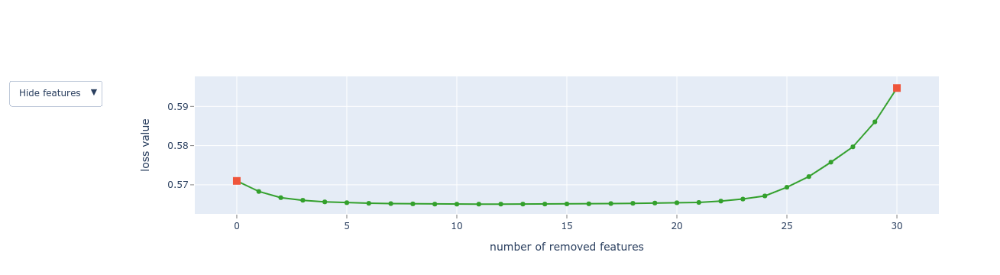

Selected features: ['f3', 'f12', 'f28']
CPU times: user 9min 9s, sys: 38.8 s, total: 9min 47s
Wall time: 1min 28s


In [44]:
%%time

shap_summary = select_features(algorithm=EFeaturesSelectionAlgorithm.RecursiveByShapValues, steps=1)

In [45]:
k = 20
COLS_BEST = [el for el in X_train.columns if el not in shap_summary['eliminated_features_names'][:X_train.shape[1] - k]]
cat_cols_trim = list(set(COLS_BEST) & set(cat_cols))

In [46]:
len(COLS_BEST)

20

In [47]:
COLS_BEST

['subject_type',
 'f1',
 'f2',
 'f3',
 'f4',
 'f6',
 'f8',
 'f9',
 'f10',
 'f11',
 'f12',
 'f14',
 'f15',
 'f16',
 'f17',
 'f19',
 'f22',
 'f23',
 'f28',
 'f29']

In [143]:
trim_params = params.copy()
trim_params['cat_features'] = cat_cols_trim
model = CatBoostClassifier(**trim_params)

In [144]:
model.fit(X_train[COLS_BEST], y_train, verbose=100 
          ,eval_set=(X_val[COLS_BEST], y_val), early_stopping_rounds=100)

0:	learn: 0.6855983	test: 0.6873334	best: 0.6873334 (0)	total: 42.2ms	remaining: 1m 3s
100:	learn: 0.5483018	test: 0.5897759	best: 0.5897759 (100)	total: 4.44s	remaining: 1m 1s
200:	learn: 0.5297612	test: 0.5835749	best: 0.5835749 (200)	total: 8.54s	remaining: 55.2s
300:	learn: 0.5200400	test: 0.5801498	best: 0.5801498 (300)	total: 12.8s	remaining: 50.9s
400:	learn: 0.5133835	test: 0.5776431	best: 0.5774471 (393)	total: 17.1s	remaining: 46.8s
500:	learn: 0.5067154	test: 0.5711457	best: 0.5710676 (499)	total: 21.1s	remaining: 42.1s
600:	learn: 0.5013409	test: 0.5688339	best: 0.5687317 (598)	total: 25.2s	remaining: 37.7s
700:	learn: 0.4972011	test: 0.5689000	best: 0.5680306 (682)	total: 29.4s	remaining: 33.5s
Stopped by overfitting detector  (100 iterations wait)

bestTest = 0.5680305878
bestIteration = 682

Shrink model to first 683 iterations.


In [50]:
train_utils.precision_in_top(model.predict_proba(X_val[COLS_BEST])[:,1], y_val) # select from base 20

0.12401648557512177

In [156]:
train_utils.precision_in_top(model.predict_proba(X_val[COLS_BEST])[:,1], y_val) # select from base 20

0.12401648557512177

### Make predicts

In [131]:
df_test = pd.read_csv('data/test.csv', sep=';')

In [147]:
df_test = preproc(df_test, False)

In [149]:
preds = model.predict_proba(df_test[COLS_BEST])[:, 1]

In [152]:
p = np.argsort(preds)[::-1]

In [153]:
cnt = int(0.05 * len(preds))
cnt

5288

In [161]:
sub = pd.DataFrame({'id': p[:cnt] + 1, 'label': preds[p[:cnt]]})
sub.head()

,id,label
0,39258,0.966353
1,846,0.964794
2,839,0.964626
3,694,0.963923
4,95520,0.963857


In [162]:
sub.to_csv('submission.csv', sep=';', index=False)

In [163]:
pd.read_csv('submission.csv', sep=';')

,id,label
0,39258,0.966353
1,846,0.964794
2,839,0.964626
3,694,0.963923
4,95520,0.963857
...,...,...
5283,60831,0.788684
5284,36442,0.788682
5285,40777,0.788639
5286,16174,0.788611


# Experements

## Train catboost per each city

In [140]:
class MetaModel:
    def __init__(self):
        self.params = {
            'n_estimators' : 1000,
            'learning_rate': .03,
            'max_depth' : 3,
            'cat_features' : cat_cols,
              # 'border_count' : 64,
              # 'l2_leaf_reg' : 10,
              # 'bagging_temperature' : 2,
              # 'rsm' : .1,
            'auto_class_weights' : 'Balanced',
            'random_state': 42,
         }
        self.models = {}
        
    def fit(self, X_train, y_train, X_val, y_val):
        for c in tqdm(X_train['city_name'].unique()):
            model = CatBoostClassifier(**self.params)
            train_mask = X_train['city_name'] == c
            val_mask = X_val['city_name'] == c
            model.fit(X_train[train_mask], y_train[train_mask], verbose=False, eval_set=(X_val[val_mask], y_val[val_mask]), early_stopping_rounds=100)
            self.models[c] = model
            
    def predict_proba(self, X):
        proba = np.zeros((len(X), 2))
        for c, model in self.models.items():
            proba[X['city_name'] == c] = model.predict_proba(X[X['city_name'] == c])
        return proba

In [141]:
model = MetaModel()
model.fit(X_train, y_train, X_val, y_val)

  0%|          | 0/49 [00:00<?, ?it/s]

In [143]:
train_utils.precision_in_top(model.predict_proba(X_val)[:,1], y_val) #tuning params

0.10865492693892843

In [146]:
len(X_train['city_name'].unique())

49

In [147]:
len(X_val['city_name'].unique())

49

## Train diffrent ML models

In [38]:
from sklearn.linear_model import LinearRegression, LogisticRegression, LogisticRegressionCV
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced',np.unique(y_train), y_train)
class_weights = torch.tensor(class_weights, dtype=torch.float)
 
print(class_weights)

tensor([ 0.5124, 20.7049])


In [ ]:
model = LogisticRegression(class_weight=class_weights)
model.fit(X_train, y_train)
train_utils.precision_in_top(model.predict_proba(X_val)[:, 1], y_val)

0.07017543859649122

In [ ]:
feature_weights = pd.DataFrame({'feature_name': X_train.columns, 'importance': model.coef_.reshape(-1)})
feature_weights = feature_weights.sort_values(by='importance', key=lambda x: -x)
feature_weights[:20]

,feature_name,importance
19,f20,6.026513
15,f16,4.313732
10,f11,3.632205
87,VTBR_close,2.563429
2,f3,2.476671
92,RTKM_open,2.188060
11,f12,2.030679
1,f2,2.027614
0,f1,2.017221
80,MTSS_open,1.842516


## Train neural network

In [ ]:
import torch
from torch import nn


if torch.cuda.is_available():    
    device = torch.device("cuda")
    print('There are %d GPU(s) available.' % torch.cuda.device_count())
    print('We will use the GPU:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

No GPU available, using the CPU instead.


In [ ]:
from torch.utils.data import Dataset, DataLoader

class MyDataset(Dataset):
    def __init__(self, X, y): 
        self.x_train=torch.tensor(X.values, dtype=torch.float32)
        self.y_train=torch.tensor(y.values, dtype=torch.float32)
 
    def __len__(self):
        return len(self.y_train)

    def __getitem__(self,idx):
        return self.x_train[idx],self.y_train[idx]


In [ ]:
X_val.shape, X_train.shape

((152766, 92), (294258, 92))

In [ ]:
train_dataset = MyDataset(X_train, y_train)
val_dataset = MyDataset(X_val, y_val)

batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, num_workers=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, num_workers=8, shuffle=True)

In [ ]:
class SmallModel(nn.Module):
    def __init__(self, num_features, num_classes):
        super().__init__()
        self.model = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(num_features, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, num_classes),
        )

    def forward(self, x):
        x = self.model(x)
        return x

In [ ]:
model = SmallModel(X_train.shape[1], 2).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights, reduction='mean').to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.5)

In [ ]:
history = train_utils.train_model(model, train_loader, val_loader, criterion, optimizer, scheduler=scheduler,
                                                                              num_epochs=15, save_name='model')

Epoch 0/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:19<00:00, 233.52it/s]


train {'precision_in_top': 0.024877650897226752, 'loss': 698.561225625997}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 510.83it/s]


test {'precision_in_top': 0.02147158942131448, 'loss': 0.6743991841668607}
updated best loss, now it 0.02147158942131448

Epoch 1/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:20<00:00, 228.20it/s]


train {'precision_in_top': 0.02263458401305057, 'loss': 1.0877460883901968}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 493.37it/s]


test {'precision_in_top': 0.01976957318669809, 'loss': 0.6657684511553058}

Epoch 2/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:21<00:00, 212.91it/s]


train {'precision_in_top': 0.021343121261555194, 'loss': 0.777412101768991}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 499.42it/s]


test {'precision_in_top': 0.018853102906520033, 'loss': 0.6669397091685751}

Epoch 3/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:20<00:00, 224.86it/s]


train {'precision_in_top': 0.023586188145731376, 'loss': 0.8932485185651066}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 494.26it/s]


test {'precision_in_top': 0.020947892118355592, 'loss': 0.6653235644339317}

Epoch 4/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:20<00:00, 222.74it/s]


train {'precision_in_top': 0.02222675367047308, 'loss': 0.8728938857697051}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 531.91it/s]


test {'precision_in_top': 0.021340665095574758, 'loss': 0.6663415800041866}

Epoch 5/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:20<00:00, 225.76it/s]


train {'precision_in_top': 0.022362697117998914, 'loss': 0.9017655309800119}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 513.09it/s]


test {'precision_in_top': 0.020947892118355592, 'loss': 0.6658663426825927}

Epoch 6/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:20<00:00, 225.10it/s]


train {'precision_in_top': 0.023110386079390973, 'loss': 1.849290274773903}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 522.70it/s]


test {'precision_in_top': 0.021340665095574758, 'loss': 0.6666570583496525}

Epoch 7/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:20<00:00, 226.99it/s]


train {'precision_in_top': 0.022838499184339316, 'loss': 1.19678335877645}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 519.93it/s]


test {'precision_in_top': 0.022257135375752815, 'loss': 0.6667177200217501}
updated best loss, now it 0.022257135375752815

Epoch 8/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:20<00:00, 224.68it/s]


train {'precision_in_top': 0.022158781946710168, 'loss': 1.014705542327529}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 522.86it/s]


test {'precision_in_top': 0.018853102906520033, 'loss': 0.6657140916943001}

Epoch 9/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:20<00:00, 223.49it/s]


train {'precision_in_top': 0.022158781946710168, 'loss': 1.4255223307935192}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 521.67it/s]


test {'precision_in_top': 0.02251898402723226, 'loss': 0.6659777112270829}
updated best loss, now it 0.02251898402723226

Epoch 10/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:20<00:00, 218.97it/s]


train {'precision_in_top': 0.021954866775421425, 'loss': 1.2192241220032978}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 523.03it/s]


test {'precision_in_top': 0.020816967792615867, 'loss': 0.666228176486707}

Epoch 11/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:21<00:00, 215.03it/s]


train {'precision_in_top': 0.02290647090810223, 'loss': 0.921256897266972}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 522.51it/s]


test {'precision_in_top': 0.015579994763026971, 'loss': 0.6652208867310778}

Epoch 12/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:22<00:00, 206.31it/s]


train {'precision_in_top': 0.021343121261555194, 'loss': 2.3244909412590538}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 525.40it/s]


test {'precision_in_top': 0.019507724535218644, 'loss': 0.6651639672917804}

Epoch 13/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:22<00:00, 203.57it/s]


train {'precision_in_top': 0.022566612289287656, 'loss': 1.0082912183536452}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 517.35it/s]


test {'precision_in_top': 0.022257135375752815, 'loss': 0.6658473146426214}

Epoch 14/14
----------


100%|██████████████████████████████████████| 4598/4598 [00:24<00:00, 190.77it/s]


train {'precision_in_top': 0.021343121261555194, 'loss': 0.7565366829826086}


100%|██████████████████████████████████████| 2387/2387 [00:04<00:00, 493.57it/s]

test {'precision_in_top': 0.023304529981670593, 'loss': 0.6664134642795184}
updated best loss, now it 0.023304529981670593

